# HeartRisk: Прогноз риска сердечных приступов

## Описание Jupyter Notebook

Jupyter Notebook содержит полный цикл исследования данных, анализа и сравнения моделей машинного обучения для прогнозирования риска сердечных приступов. Работа выполнена в рамках проекта HeartRisk и фокусируется на подготовке данных, поиске паттернов и выборе оптимальной модели.

**Основные разделы:**
1. Загрузка и исследование данных:
- Описание структуры датасета (обучающий и тестовый наборы)
- Анализ пропусков, дубликатов, выбросов, корреляций между признаками
- Обзор литературы с целью поиска релевантных признаков
- Исследование взаимосвязей между факторами (например, влияние возраста, давления, биохимии крови)
- Визуализация распределения целевого признака ("высокий" vs "низкий" риск)
2. Предобработка данных:
- Удаление бесполезных/дублирующих признаков
- Обработка категориальных переменных
- Масштабирование числовых признаков
- Поиск и устранение утечек целевого признака
3. Выбор метрики и стратегии оценки:
- Обоснование выбора метрики
- Разделение на тренировочную/валидационную выборки
4. Обучение и сравнение моделей:
- Тестирование алгоритмов: LogisticRegression, SVC, DecisionTreeClassifier, CatBoost
- Подбор гиперпараметров через GridSearchCV и RandomizedSearchCV
- Сравнение метрик на валидации
- Интерпретация важности признаков
5. Feature Engineering
  
6. Выводы:
- Лучшая модель и причины её выбора
- Сильные и слабые стороны подхода
- Рекомендации для улучшения качества предсказаний

**Ключевая метрика**

При прогнозировании высокого или низкого риска поражения сердца *специфичность* становится критически важной метрикой, так как она позволяет оценить, насколько надежно модель исключает заболевание у здоровых пациентов.

*Специфичность* необходима, чтобы:
- Минимизировать вред от ложных диагнозов для здоровых пациентов,
- Снизить нагрузку на медицинскую систему,
- Обеспечить доверие к отрицательным результатам модели.

Однако важно учитывать ее в связке с чувствительностью и контекстом задачи. Например, в экстренной диагностике инфаркта чувствительность будет приоритетной, а в плановых обследованиях — специфичность. В рамках данного проекта сделан акцент на *специфичности*.

**Используемые основные технологии:**
- Pandas/Numpy: анализ и трансформация данных.
- Scikit-learn/CatBoost: моделирование.
- Matplotlib/Seaborn: визуализация.

**Особенности:**
- Ноутбук оформлен как отдельный исследовательский модуль, без кода API или инфраструктуры проекта.
- Все этапы документированы, с комментариями и выводами по каждому шагу.
- Результаты экспериментов сохранены для воспроизводимости.

Этот файл служит основой для принятия решений по выбору модели и предобработке данных в рамках проекта HeartRisk.

## Установка и импорт библиотек, определение констант

In [1]:
# Стандартные библиотеки
#from collections import defaultdict
import os
import warnings

# Сторонние библиотеки
from catboost import CatBoostClassifier
from catboost import Pool

from imblearn.metrics import specificity_score

from IPython.display import display, HTML

from itertools import combinations

import joblib

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
#from matplotlib.ticker import MaxNLocator
import matplotlib.colors as mcolors

import missingno as msno

import numpy as np
import pandas as pd

from phik.report import plot_correlation_matrix

#import plotly.express as px
#import plotly.graph_objects as go

#import scipy.stats as st

import seaborn as sns

import shap

from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    make_scorer,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
    f1_score
)
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    StratifiedKFold,
    train_test_split,
)
#from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    LabelEncoder,
    MinMaxScaler,
    #OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
)
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import sys

# Глобальные настройки
pd.set_option("display.max_columns", None)
pd.options.mode.chained_assignment = None

# Игнорирование предупреждений
warnings.filterwarnings("ignore", category=FutureWarning)

In [4]:
# константа RANDOM_STATE
RANDOM_STATE = 42

# константа TEST_SIZE
TEST_SIZE = 0.25

# пороговый уровень для стат-теста
#ALFA = 0.05

# Защита от деления на ноль
EPSILON = 1e-6

## Используемые в проекте основные собственные функции

In [5]:
def plot_distribution_with_boxplot(df, features, target_col, category_order=None):
    """Визуализирует распределения признаков с разделением по категориям целевой переменной.

    Автоматически преобразует числовые целевые переменные в категориальные,
    если они содержат ≤10 уникальных значений. Это преобразование не влияет на исходный датафрейм.

    Создает сетку графиков:
    - Для каждого признака отображаются 2 строки:
      1) Гистограмма с наложениями категорий (stacked) и KDE-кривой
      2) Горизонтальный boxplot, где категории размещены по оси y
    - Цвета категорий согласованы между графиками и указаны в легенде
    - Графики автоматически размещаются в сетке (до 4 столбцов)
    - Убираются пустые оси для незаполненных ячеек сетки
    - Настройки: сетка, поворот меток, оптимизация макета

    Args:
        df (pd.DataFrame): DataFrame с данными
        features (List[Tuple[str, str]]): Список кортежей (колонка, человекочитаемая метка)
        target_col (str): Название целевой колонки. Если тип числовой и содержит ≤10 уникальных значений,
                          будет преобразована в категориальную внутри функции
        category_order (Optional[List[str]]): Список категорий в нужном порядке. Если None,
            используется отсортированный порядок (по умолчанию None)

    Notes:
        - features ожидает кортежи (колонка, человекочитаемая метка)
    """
    # Проверка и преобразование целевой переменной
    target_series = df[target_col]
    unique_count = target_series.nunique()
    is_numeric = pd.api.types.is_numeric_dtype(target_series)

    # Создаем временную целевую переменную
    if is_numeric and unique_count <= 10:
        # Преобразуем числовые значения в строки для категоризации
        transformed_target = target_series.astype(str)
        print(f"Целевой признак '{target_col}' преобразован в категориальный. "
              f"Уникальные значения: {sorted(transformed_target.unique())}")
    else:
        transformed_target = target_series.copy()

    # Получаем категории в нужном порядке (удалив строки с пропусками, если они имеются)
    if category_order is None:
        if is_numeric and unique_count <= 10:
            # Сортируем оригинальные числовые значения, затем преобразуем в строки
            numeric_categories = sorted(df[target_col].dropna().unique())
            categories = [str(val) for val in numeric_categories]
        else:
            # Для нечисловых или числовых с >10 уникальными значениями
            categories = sorted(transformed_target.dropna().unique())
    else:
        categories = category_order

    # Подготовка цветовой палитры и элементов легенды
    palette = plt.cm.Paired(np.linspace(0, 1, len(categories)))
    category_to_color = {cat: color for cat, color in zip(categories, palette)}

    legend_elements = [
        Patch(facecolor=color, label=str(cat), alpha=0.6)
        for cat, color in category_to_color.items()
    ]

    # Настройка сетки графиков
    n_features = len(features)
    ncols = min(4, n_features)  # количество столбцов в сетке графиков (не более 4)
    rows_per_feature = 2  # количество строк на каждый признак (2 строки: гистограмма и boxplot)
    nrows = (n_features + ncols - 1) // ncols * rows_per_feature  # общее количество строк

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(14, 3 * nrows),
        squeeze=False  # гарантирует двумерный массив axes
    )

    # Цикл по признакам для создания графиков
    for i, (feature_col, feature_label) in enumerate(features):
        col = i % ncols  # столбец для текущего признака
        row_base = (i // ncols) * rows_per_feature  # базовая строка для текущего признака

        # Гистограмма
        ax_hist = axes[row_base, col]
        sns.histplot(
            data=df,
            x=feature_col,
            hue=transformed_target,  # Используем преобразованный целевой признак
            kde=True,
            multiple='stack',
            palette=category_to_color,
            ax=ax_hist,
            legend=False
        )

        # Настройка гистограммы
        ax_hist.set_title(f'Распределение {feature_label}', fontsize=10)
        ax_hist.set_xlabel('')

        if i == 0:
            ax_hist.set_ylabel('Частота', fontsize=9)
        else:
            ax_hist.set_ylabel('')

        if i == 0:
            ax_hist.legend(
                handles=legend_elements,
                title=target_col,
                fontsize=8,
                title_fontsize=8,
                loc='upper right'
            )

        ax_hist.grid(axis='y', alpha=0.3)
        ax_hist.tick_params(axis='x', labelrotation=0)

        # Boxplot
        ax_box = axes[row_base + 1, col]
        sns.boxplot(
            data=df,
            x=feature_col,
            y=transformed_target,  # Используем преобразованный целевой признак
            order=categories,
            palette=category_to_color,
            orient='h',
            ax=ax_box,
            width=0.6
        )

        # Настройка boxplot
        if i == 0:
            ax_box.tick_params(axis='y', labelrotation=45, labelsize=8)
        else:
            ax_box.set_yticklabels([])

        ax_box.set_xlabel(feature_label, fontsize=9)
        ax_box.grid(axis='y', alpha=0.3)
        ax_box.tick_params(axis='x', labelrotation=0)
        ax_box.set_ylabel('')

    # Скрытие пустых осей
    for row in range(nrows):
        for col in range(ncols):
            current_idx = (row // rows_per_feature) * ncols + col
            if current_idx >= n_features:
                axes[row, col].set_visible(False)

    # Настройка макета и отображение графиков
    plt.tight_layout(h_pad=1.5, w_pad=1.5)
    plt.show()

In [6]:
def plot_distribution_with_countplot(df, features, target_col, category_order=None):
    """Визуализирует распределение дискретных признаков с разбивкой по категориям целевой переменной.

    Автоматически преобразует числовые целевые переменные в категориальные,
    если они содержат ≤10 уникальных значений. Это преобразование не влияет на исходный датафрейм.

    Создает сетку графиков countplot для каждого признака:
    - Использует countplot для отображения частот дискретных значений
    - Цвета категорий согласованы между всеми графиками
    - Автоматически формирует сетку (максимум 4 столбца)
    - Добавляет легенду и подписи осей
    - Оптимизировано для дискретных/целочисленных признаков

    Args:
        df (pd.DataFrame): Датасет с данными для визуализации
        features (List[Tuple[str, str]]): Список признаков для анализа в формате (столбец_датасета, человекочитаемое_название).
            Пример: [('age', 'Возраст'), ('category_id', 'Категория')]
        target_col (str): Название столбца с целевой переменной. Если тип числовой и содержит ≤10 уникальных значений,
                          будет преобразована в категориальную внутри функции
        category_order (Optional[List[str]]): Список категорий в нужном порядке. Если None,
            используется отсортированный порядок (по умолчанию None)

    Returns:
        None: Выводит сетку графиков в matplotlib

    Notes:
        - Функция автоматически оптимизирует макет для удобства чтения
    """
    # Проверка и преобразование целевой переменной
    target_series = df[target_col]
    unique_count = target_series.nunique()
    is_numeric = pd.api.types.is_numeric_dtype(target_series)

    # Создаем временную целевую переменную
    if is_numeric and unique_count <= 10:
        # Преобразуем числовые значения в строки для категоризации
        transformed_target = target_series.astype(str)
        print(f"Признак '{target_col}' преобразован в категориальный. "
              f"Уникальные значения: {sorted(transformed_target.unique())}")
    else:
        transformed_target = target_series.copy()

    # Фиксируем порядок категорий из параметра или из данных
    if category_order is None:
        if is_numeric and unique_count <= 10:
            # Сортируем оригинальные числовые значения, затем преобразуем в строки
            numeric_categories = sorted(df[target_col].dropna().unique())
            categories = [str(val) for val in numeric_categories]
        else:
            # Для нечисловых или числовых с >10 уникальными значениями
            categories = sorted(transformed_target.dropna().unique())
    else:
        categories = category_order

    # Создаем палитру цветов
    rgba_colors = plt.cm.Paired(np.linspace(0, 1, len(categories)))
    hex_colors = [mcolors.to_hex(color) for color in rgba_colors]
    palette = {cat: color for cat, color in zip(categories, hex_colors)}  # Теперь словарь
    category_to_color = palette  # Для легенды

    # Создаем элементы легенды
    legend_elements = [
        Patch(facecolor=color, label=str(cat), alpha=0.6)
        for cat, color in category_to_color.items()
    ]

    # Настройка сетки графиков
    n_features = len(features)
    ncols = min(4, n_features)
    nrows = (n_features + ncols - 1) // ncols

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(14, 3 * nrows),
        squeeze=False
    )

    for i, (feature_col, feature_label) in enumerate(features):
        row = i // ncols
        col = i % ncols
        ax = axes[row, col]

        # Используем преобразованный целевой признак
        sns.countplot(
            data=df,
            x=feature_col,
            hue=transformed_target,
            palette=hex_colors,
            ax=ax,
            edgecolor=".2",
            order=sorted(df[feature_col].unique()),
            hue_order=categories
        )

        ax.set_title(f'Распределение {feature_label}', fontsize=10)
        ax.set_xlabel(feature_label, fontsize=9)

        if col == 0:
            ax.set_ylabel('Частота', fontsize=9)
        else:
            ax.set_ylabel('')

        # Легенда только для первого графика
        if i == 0:
            ax.legend(
                handles=legend_elements,
                title=target_col,
                fontsize=8,
                title_fontsize=8,
                loc='upper right'
            )
        else:
            ax.legend_.remove()

        ax.grid(axis='y', alpha=0.3)
        ax.tick_params(axis='both', labelsize=8, labelrotation=0)

        # код для округления меток оси X до 2 знаков после запятой
        ticks = ax.get_xticks()  # Получаем текущие позиции тиков
        ax.set_xticks(ticks)     # Фиксируем тики

        labels = [t.get_text() for t in ax.get_xticklabels()]  # Получаем текущие метки
        new_labels = []
        for label in labels:
            try:
                value = float(label)  # Пробуем преобразовать в число
                new_labels.append(f"{value:.2f}")  # Округляем до 2 знаков
            except ValueError:
                new_labels.append(label)  # Если не число — оставляем как есть
        ax.set_xticklabels(new_labels)  # Обновляем метки

    # Скрываем пустые оси
    for row in range(nrows):
        for col in range(ncols):
            idx = row * ncols + col
            if idx >= n_features:
                axes[row, col].set_visible(False)

    plt.tight_layout(h_pad=1.5, w_pad=1.5)
    plt.show()

In [7]:
def plot_violin_combinations(
    df: pd.DataFrame,
    x_column: str = 'Age',
    y_features: list = None,
    hue_features: list = None,
    max_classes: int = 10
):
    """
    Строит комбинации violinplot для заданных/автоматически определённых категориальных признаков.

    Parameters:
    -----------
    df : pd.DataFrame
        Входной датафрейм с данными.
    x_column : str, optional (default='Age')
        Имя непрерывного числового признака для оси X (например, возраст).
    y_features : list, optional (default=None)
        Список категориальных признаков для оси Y.
        Должны быть нечисловыми типами (object, category).
        Если None, определяются автоматически:
        - Объектные столбцы с 2–10 уникальными значениями.
    hue_features : list, optional (default=None)
        Список бинарных категориальных признаков для разделения (hue).
        Если None, определяются автоматически:
        - Объектные/числовые столбцы с ровно 2 уникальными значениями.
    max_classes : int, optional (default=10)
        Максимальное количество уникальных значений для признаков на оси Y (по умолчанию до 10).

    Returns:
    --------
    None
        Выводит графики и/или сообщения об ошибках.
    """

    # --- Шаг 1: Проверка корректности входных данных ---
    # Проверка наличия x_column и его типа
    if x_column not in df.columns:
        raise ValueError(f"Столбец '{x_column}' не найден в датафрейме.")
    if not pd.api.types.is_numeric_dtype(df[x_column]):
        raise ValueError(f"Столбец '{x_column}' должен быть числовым.")

    # --- Шаг 2: Автоматическое определение признаков ---
    # Если пользователь не указал y_features, определяем их автоматически
    if y_features is None:
        y_features = []
        # Только объектные или категориальные столбцы с 2–10 уникальными значениями
        for col in df.select_dtypes(include=['object', 'category']).columns:
            if 2 <= df[col].nunique(dropna=False) <= max_classes:
                y_features.append(col)
        y_features = list(set(y_features))  # Удаление дубликатов

    # Проверка, что все y_features не являются числовыми
    for col in y_features:
        if pd.api.types.is_numeric_dtype(df[col]):
            raise ValueError(f"Признак '{col}' должен быть категориальным (не числовой тип).")

    # Если пользователь не указал hue_features, определяем их автоматически
    if hue_features is None:
        hue_features = []
        # Объектные столбцы с ровно 2 уникальными значениями
        for col in df.select_dtypes(include='object').columns:
            if df[col].nunique(dropna=False) == 2:
                hue_features.append(col)
        # Числовые столбцы с ровно 2 уникальными значениями
        for col in df.select_dtypes(include=['number']).columns:
            if df[col].nunique(dropna=False) == 2:
                hue_features.append(col)
        hue_features = list(set(hue_features))  # Удаление дубликатов

    # --- Шаг 3: Проверка наличия подходящих признаков ---
    if not y_features:
        print("Не найдено подходящих категориальных признаков для оси Y (не числовой тип, 2–10 уникальных значений).")
        return
    if not hue_features:
        print("Не найдено бинарных признаков для разделения (hue).")
        return

    # --- Шаг 4: Генерация уникальных комбинаций (y, hue) ---
    combinations = []
    seen = set()  # Для избежания повторений
    for y_col in y_features:
        for hue_col in hue_features:
            if y_col != hue_col:  # Исключаем совпадающие признаки
                key = tuple(sorted([y_col, hue_col]))  # Уникальный ключ для комбинации
                if key not in seen:
                    combinations.append((y_col, hue_col))
                    seen.add(key)

    if not combinations:
        print("Не удалось сгенерировать комбинации (y, hue). Проверьте входные данные.")
        return

    # --- Шаг 5: Расчёт сетки подграфиков ---
    total_plots = len(combinations)
    ncols = min(5, total_plots)  # Не более 5 графиков в строке
    nrows = (total_plots + ncols - 1) // ncols  # Округление вверх

    # --- Шаг 6: Создание фигуры и подграфиков ---
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten()  # Преобразуем в одномерный массив для удобства

    # --- Шаг 7: Построение графиков ---
    for i, (y_col, hue_col) in enumerate(combinations):
        ax = axes[i]
        sns.violinplot(
            x=x_column,
            y=y_col,
            hue=hue_col,
            data=df,
            split=True,
            palette='Set2',
            inner='quartile',
            ax=ax
        )
        ax.set_title(f"{y_col} vs {hue_col}")
        ax.legend(title=hue_col, loc='upper right')

    # --- Шаг 8: Удаление пустых подграфиков ---
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # --- Шаг 9: Финальная настройка и отображение ---
    plt.tight_layout()
    plt.show()

In [8]:
def plot_categorical_distributions(
    df: pd.DataFrame,
    target_col: str,
    categorical_features: list = None
):
    """
    Строит распределение категориальных признаков относительно бинарного целевого признака.

    Args:
        df (pd.DataFrame): Входной датафрейм с данными.
        target_col (str): Название целевого бинарного признака.
        categorical_features (list, optional): Список категориальных признаков для отображения.
            Если None, автоматически определяются все категориальные колонки в df (типы 'object' или 'category').

    Raises:
        ValueError: Если целевой столбец отсутствует в df или не является бинарным.
        KeyError: Если указанные категориальные признаки отсутствуют в df.

    Example:
        >>> plot_categorical_distributions(df, 'Heart Attack Risk (Binary)', ['Gender', 'Smoking'])
    """

    # Проверка наличия целевого столбца
    if target_col not in df.columns:
        raise ValueError(f"Целевой столбец '{target_col}' отсутствует в датафрейме.")

    # Проверка, что целевой столбец бинарный
    unique_values = df[target_col].dropna().unique()
    if len(unique_values) != 2:
        raise ValueError(f"Целевой столбец '{target_col}' должен быть бинарным (иметь ровно 2 уникальных значения).")

    # Автоматическое определение категориальных признаков, если не переданы
    if categorical_features is None:
        categorical_features = df.select_dtypes(include=['object', 'category']).columns.tolist()
        # Исключаем целевой столбец из категориальных признаков
        categorical_features = [col for col in categorical_features if col != target_col]
    else:
        # Проверка наличия переданных категориальных признаков в датафрейме
        missing_cols = [col for col in categorical_features if col not in df.columns]
        if missing_cols:
            raise KeyError(f"Следующие категориальные признаки отсутствуют в датафрейме: {missing_cols}")

    # Проверка, что есть признаки для отображения
    if not categorical_features:
        raise ValueError("Не найдено категориальных признаков для отображения.")

    # Вычисляем количество групп и размеры сетки
    total_groups = (len(categorical_features) + 4) // 5  # Количество групп по 5 признаков
    nrows = total_groups * 2  # По 2 строки на группу (абсолютные значения и доли)
    ncols = 5  # Максимум 5 столбцов

    # Создаем фигуру с одинаковыми размерами ячеек
    fig, axs = plt.subplots(
        nrows, ncols,
        figsize=(ncols * 4, nrows * 3),  # Общий размер фигуры
        gridspec_kw={
            'height_ratios': [1] * nrows,  # Все строки одинаковой высоты
            'width_ratios': [1] * ncols    # Все столбцы одинаковой ширины
        },
        constrained_layout=True  # Автоматическое выравнивание
    )
    fig.suptitle('Распределение категориальных признаков (абсолютные значения и доли)', fontsize=16)

    # Основной цикл для построения графиков
    for i, feature in enumerate(categorical_features):
        group = i // 5
        col = i % 5
        row_abs = group * 2
        row_rel = row_abs + 1

        # График абсолютных значений
        sns.countplot(data=df, x=feature, hue=target_col, ax=axs[row_abs, col])
        axs[row_abs, col].set_title(f'Абсолютные значения: {feature}')
        axs[row_abs, col].tick_params(axis='x', rotation=45)
        axs[row_abs, col].legend(title=target_col, loc='upper right')
        axs[row_abs, col].grid(axis='y', linestyle='--', alpha=0.7)

        # График долей
        grouped = (df
                  .groupby([feature, target_col])
                  .size()
                  .unstack(fill_value=0)
                  .apply(lambda x: x / x.sum(), axis=1))
        grouped.plot(kind='bar', stacked=True, ax=axs[row_rel, col], colormap='viridis')
        axs[row_rel, col].set_title(f'Доли: {feature}')
        axs[row_rel, col].tick_params(axis='x', rotation=45)
        axs[row_rel, col].set_ylabel('Доля')
        axs[row_rel, col].legend(title=target_col, loc='upper right')
        axs[row_rel, col].grid(axis='y', linestyle='--', alpha=0.7)

    # Удаление пустых подграфиков
    for row in range(nrows):
        for col in range(ncols):
            feature_index = (row // 2) * ncols + col
            if feature_index >= len(categorical_features):
                fig.delaxes(axs[row, col])  # Удаляем ось

    plt.show()

In [9]:
def plot_scatter_by_class(df, target, features=None):
    """
    Строит диаграммы рассеяния для всех пар числовых признаков,
    разделяя точки по классам целевого бинарного признака.

    Параметры:
    df (pd.DataFrame): датафрейм с данными
    target (str): имя целевого бинарного признака
    features (list of str, optional): список числовых признаков для анализа.
                                      Если None, используются все числовые признаки, кроме целевого.

    Пример использования:
    >>> plot_scatter_by_class(df, 'target', features=['age', 'income'])
    """

    # Определяем числовые признаки
    if features is None:
        # Выбираем все числовые признаки
        numeric_features = df.select_dtypes(include=['number']).columns.tolist()
        # Исключаем целевой признак, если он числовой
        if target in numeric_features:
            numeric_features.remove(target)
    else:
        # Проверяем, что переданные признаки существуют в датафрейме и числовые
        numeric_features = []
        for col in features:
            if col not in df.columns:
                raise ValueError(f"Колонка '{col}' не найдена в датафрейме.")
            if pd.api.types.is_numeric_dtype(df[col]):
                numeric_features.append(col)
            else:
                raise ValueError(f"Колонка '{col}' не является числовой.")
        # Удаляем целевой признак из списка, если он там есть
        if target in numeric_features:
            numeric_features.remove(target)

    # Проверяем, что есть хотя бы два числовых признака для построения пар
    if len(numeric_features) < 2:
        raise ValueError("Недостаточно числовых признаков для построения диаграмм рассеяния. Требуется минимум 2.")

    # Генерируем все возможные пары признаков
    pairs = list(combinations(numeric_features, 2))
    n_plots = len(pairs)

    # Проверяем, что целевой признак бинарный
    class_values = df[target].unique()
    if len(class_values) != 2:
        raise ValueError("Целевой признак должен быть бинарным (иметь ровно два уникальных значения).")

    # Определяем параметры сетки подграфиков
    n_cols = min(5, n_plots)  # Максимум 5 подграфиков в ряду
    n_rows = (n_plots + n_cols - 1) // n_cols  # Округление вверх

    # Создаем фигуру и оси
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))

    # Приводим axes к одномерному массиву для удобства
    if isinstance(axes, plt.Axes):  # Если один подграфик
        axes = [axes]
    else:
        axes = axes.flatten()

    # Проходим по всем парам и строим графики
    for idx, (x_feature, y_feature) in enumerate(pairs):
        ax = axes[idx]
        # Разделяем данные по классам и строим точки
        for cls in class_values:
            subset = df[df[target] == cls]
            ax.scatter(
                subset[x_feature],
                subset[y_feature],
                label=f'{target} = {cls}',
                alpha=0.6,
                edgecolor='none'  # Убираем границы точек для улучшения читаемости
            )
        ax.set_xlabel(x_feature)
        ax.set_ylabel(y_feature)
        ax.grid(True)
        # Добавляем легенду только на первый график
        if idx == 0:
            ax.legend(title=target)

    # Удаляем лишние подграфики
    for idx in range(n_plots, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

In [10]:
def phik_correlation_matrix(df, threshold=0.9, output_interval_cols=True):
    """Строит матрицу корреляции Фи-К и выводит пары признаков с корреляцией выше порога.

    Args:
        df (pd.DataFrame): DataFrame с данными для анализа.
        threshold (float): Пороговое значение корреляции (в диапазоне [0, 1]).
            Значения выше порога будут отображены (по умолчанию 0.9).
        output_interval_cols (bool): Флаг, указывающий возвращать ли список непрерывных
            числовых столбцов (по умолчанию True).

    Returns:
        Tuple[pd.DataFrame, Optional[List[str]]]:
            - DataFrame с парами признаков и их коэффициентами корреляции Фи-К.
            - Список непрерывных числовых столбцов (если output_interval_cols=True).

    Notes:
        - Корреляция Фи-К (Phi-K) рассчитывается для категориальных признаков.
        - Порог threshold должен быть в интервале [0, 1].
        - Числовые столбцы автоматически определяются как необъектные.
    """
    # Получение списка непрерывных числовых столбцов
    interval_cols = [
        col
        for col in df.select_dtypes(include=["number"]).columns
        if (df[col].nunique() > 50) or ((df[col] % 1 != 0).any())
    ]

    # Вычисление матрицы phi_k
    phik_overview = df.phik_matrix(interval_cols=interval_cols).round(2)

    # Динамическое определение размера фигуры для подстройки размера ячеек
    num_cols = len(phik_overview.columns)
    num_rows = len(phik_overview.index)
    cell_size = 0.8  # Дюймов на ячейку
    figsize = (num_cols * cell_size, num_rows * cell_size)

    # Визуализация матрицы
    plot_correlation_matrix(
        phik_overview.values,
        x_labels=phik_overview.columns,
        y_labels=phik_overview.index,
        vmin=0,
        vmax=1,
        color_map="Greens",
        title=r"Матрица корреляции $\phi_K$",
        fontsize_factor=1,
        figsize=figsize
    )
    plt.tight_layout()
    plt.show()

    # Фильтрация значений выше порога
    close_to_one = phik_overview[phik_overview >= threshold]
    # Удаление диагонали и нижней треугольной матрицы
    close_to_one = close_to_one.where(np.triu(np.ones(close_to_one.shape), k=1).astype(bool))

    # Преобразование в формат "длинной таблицы"
    close_to_one_stacked = close_to_one.stack().reset_index()
    close_to_one_stacked.columns = ["признак_1", "признак_2", "корреляция"]
    close_to_one_stacked = close_to_one_stacked.dropna(subset=["корреляция"])

    # Классификация по шкале Чеддока
    def classify_correlation(corr):
        if corr >= 0.9:
            return "Очень высокая"
        elif corr >= 0.7:
            return "Высокая"
        elif corr >= 0.5:
            return "Заметная"
        elif corr >= 0.3:
            return "Умеренная"
        elif corr >= 0.1:
            return "Слабая"
        else:
            return "-"

    close_to_one_stacked["класс_корреляции"] = close_to_one_stacked["корреляция"].apply(classify_correlation)

    # Сортировка по убыванию корреляции
    close_to_one_sorted = close_to_one_stacked.sort_values(by="корреляция", ascending=False).reset_index(drop=True)

    # Вывод сообщения, если нет значимых корреляций
    if len(close_to_one_sorted) == 0 and threshold >= 0.9:
        print("\033[1mМультиколлинеарность между парами входных признаков отсутствует\033[0m")

    # Возврат результатов
    return (close_to_one_sorted, interval_cols) if output_interval_cols else close_to_one_sorted

In [11]:
def vif_(X, font_size=12):
    """Строит столбчатую диаграмму с коэффициентами инфляции дисперсии (VIF) для всех входных признаков.

    Args:
        X (pd.DataFrame): DataFrame с входными признаками для анализа.
        font_size (int): Размер шрифта для текстовых элементов графика (по умолчанию 12).

    Notes:
        - Коэффициент инфляции дисперсии (VIF) показывает степень мультиколлинеарности между признаками.
        - График отображается напрямую через matplotlib.
    """
    # Кодируем категориальные признаки
    X_encoded = pd.get_dummies(X, drop_first=True, dtype=int)

    # Добавляем константу для корректного расчета VIF
    X_with_const = sm.add_constant(X_encoded)

    # Вычисляем VIF для всех признаков, кроме константы (индексы начинаются с 1)
    vif = [variance_inflation_factor(X_with_const.values, i)
           for i in range(1, X_with_const.shape[1])]  # Исключаем константу (0-й столбец)

    # Построение графика с использованием исходных названий признаков (без константы)
    num_features = X_encoded.shape[1]
    fig_width = num_features * 1.2
    fig_height = 12

    plt.figure(figsize=(fig_width, fig_height))
    ax = sns.barplot(x=X_encoded.columns, y=vif)

    # Настройки графика
    ax.set_ylabel('VIF', fontsize=font_size)
    ax.set_xlabel('Входные признаки', fontsize=font_size)
    plt.title('Коэффициент инфляции дисперсии для входных признаков (VIF)', fontsize=font_size)

    # Метки на осях
    plt.xticks(rotation=90, ha='right', fontsize=font_size)
    ax.tick_params(axis='y', labelsize=font_size)

    # Добавляем значения на столбцы (опционально)
    # ax.bar_label(ax.containers[0], fmt='%.2f', padding=3, fontsize=font_size)

    plt.tight_layout()
    plt.show()

In [12]:
def compare_distributions(df1, df2, train_name='Тренировочная', test_name='Тестовая', n_cols=4):
    """
    Сравнивает распределения общих признаков между двумя датафреймами и отображает графики.

    Аргументы:
    df1 (pd.DataFrame): Первый датафрейм для сравнения.
    df2 (pd.DataFrame): Второй датафрейм для сравнения.
    train_name (str, optional): Название первого датафрейма в легенде (по умолчанию 'Тренировочная').
    test_name (str, optional): Название второго датафрейма в легенде (по умолчанию 'Тестовая').
    n_cols (int, optional): Количество столбцов в сетке графиков (по умолчанию 4).

    Возвращает:
    None: Функция отображает графики, не возвращает значения.
    """
    # Определение общих признаков
    common_features = list(set(df1.columns) & set(df2.columns))

    # Настройка сетки графиков
    n_features = len(common_features)
    n_rows = (n_features + n_cols - 1) // n_cols
    fig, axes = plt.subplots(
        nrows=n_rows,
        ncols=n_cols,
        figsize=(20, 5 * n_rows),
        squeeze=False,
    )
    axes = axes.ravel()

    for i, feature in enumerate(common_features):
        ax = axes[i]

        # Определение типа признака
        if df1[feature].dtype == 'object':
            # Обработка категориальных признаков
            train_counts = (
                df1[feature]
                .value_counts(normalize=True, dropna=False)
                .reset_index()
            )
            train_counts.columns = ['Category', 'Proportion']
            train_counts['Source'] = train_name

            test_counts = (
                df2[feature]
                .value_counts(normalize=True, dropna=False)
                .reset_index()
            )
            test_counts.columns = ['Category', 'Proportion']
            test_counts['Source'] = test_name

            combined = pd.concat([train_counts, test_counts])
            combined['Category'] = combined['Category'].astype(str)
            all_categories = sorted(combined['Category'].unique())

            # Добавление пустых категорий, если нужно
            sources = combined['Source'].unique()
            if len(sources) < 2:
                missing = test_name if train_name in sources else train_name
                dummy = pd.DataFrame({
                    'Category': [''],
                    'Proportion': [0],
                    'Source': [missing],
                })
                combined = pd.concat([combined, dummy], ignore_index=True)

            palette = {
                train_name: '#1f77b4',
                test_name: '#ff7f0e',
            }

            sns.barplot(
                x='Category',
                y='Proportion',
                hue='Source',
                data=combined,
                order=all_categories,
                ax=ax,
                palette=palette,
                hue_order=[train_name, test_name],
            )

            ax.set_title(f'Категория: {feature}', fontsize=10)
            ax.legend(
                title='Выборка',
                loc='upper right',
                fontsize=8,
                frameon=True,
            )
            ax.set_ylabel('Доля', fontsize=8)
            ax.set_xlabel('')
            plt.setp(ax.get_xticklabels(), rotation=45, ha='right', fontsize=8)

        else:
            # Обработка числовых признаков
            train_data = df1[[feature]].assign(Source=train_name)
            test_data = df2[[feature]].assign(Source=test_name)
            combined = pd.concat([train_data, test_data], ignore_index=True)

            sns.kdeplot(
                data=combined,
                x=feature,
                hue='Source',
                ax=ax,
                palette=['#1f77b4', '#ff7f0e'],
                hue_order=[train_name, test_name],
                bw_method=0.15,
                common_norm=False,
            )

            ax.set_title(f'Числовой признак: {feature}', fontsize=10)
            ax.legend(
                title='Выборка',
                labels=[train_name, test_name],
                loc='upper right',
                fontsize=8,
                frameon=True,
            )
            ax.set_ylabel('Плотность', fontsize=8)
            ax.set_xlabel('')

    # Скрытие пустых осей
    for ax in axes[n_features:]:
        ax.set_visible(False)

    # Настройка общего вида
    plt.tight_layout()
    plt.subplots_adjust(top=0.97)
    plt.suptitle('Сравнение распределений признаков между выборками', fontsize=14, y=1.02)
    plt.show()

## Загрузка данных

In [13]:
# считываем данные из csv-файлов в датафреймы и сохраняем в переменные
try:
    test = pd.read_csv('/datasets/heart_test.csv', index_col='id')
    train = pd.read_csv('/datasets/heart_train.csv', index_col='id')
except:
    test = pd.read_csv('heart_test.csv', index_col='id')
    train = pd.read_csv('heart_train.csv', index_col='id')

In [14]:
# сделаем копии датафреймов
test_df = test.copy()
train_df = train.copy()

In [15]:
# просматриваем по три последних строки в данных

# создаем словарь: ключ — название датафрейма, значение — сам датафрейм
dataframes = {
    'test_df' : test_df,
    'train_df' : train_df,
}

# выводим по три последних строки в каждом датафрейме
for name, df in dataframes.items():
    print(f'\033[1mДатафрейм {name}\033[0m')
    display(df.tail(3))
    print('')

Датафрейм test_df


,Unnamed: 0,Age,Cholesterol,Heart rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Blood sugar,CK-MB,Troponin,Gender,Systolic blood pressure,Diastolic blood pressure
id,,,,,,,,,,,,,,,,,,,,,,,,,,
2456,963,0.213483,0.596429,0.076994,1.0,0.0,1.0,1.0,1.0,0.549976,0,0.0,1.0,2.0,0.771651,0.710667,0.662209,0.914286,4.0,0.666667,0.227018,0.048229,0.036512,Male,0.696774,0.767442
4984,964,0.337079,0.996429,0.036664,1.0,0.0,1.0,0.0,0.0,0.441581,2,0.0,1.0,5.0,0.790726,0.533684,0.862390,0.850649,2.0,0.500000,0.132411,0.006904,0.000485,Male,0.348387,0.627907
6521,965,0.359551,0.864286,0.061412,1.0,0.0,1.0,1.0,0.0,0.234876,2,0.0,1.0,1.0,0.235260,0.571713,0.088066,0.572727,7.0,0.166667,0.227018,0.048229,0.036512,Male,0.722581,0.244186



Датафрейм train_df


,Unnamed: 0,Age,Cholesterol,Heart rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Heart Attack Risk (Binary),Blood sugar,CK-MB,Troponin,Gender,Systolic blood pressure,Diastolic blood pressure
id,,,,,,,,,,,,,,,,,,,,,,,,,,,
5390,8682,0.471910,0.067857,0.023831,1.0,0.0,1.0,0.0,1.0,0.076336,2,0.0,1.0,10.0,0.997170,0.378114,0.077175,0.189610,1.0,0.833333,0.0,0.227018,0.048229,0.036512,Male,0.374194,0.558140
860,8683,0.595506,0.000000,0.075160,0.0,1.0,1.0,0.0,1.0,0.371759,2,0.0,0.0,9.0,0.881231,0.554353,0.496346,0.892208,4.0,0.500000,0.0,0.227018,0.048229,0.036512,Male,0.477419,0.744186
7270,8684,0.292135,0.342857,0.021082,0.0,1.0,1.0,1.0,0.0,0.567079,0,0.0,0.0,9.0,0.169786,0.753330,0.990535,0.975325,5.0,0.833333,0.0,0.227018,0.048229,0.036512,Male,0.703226,0.639535


Мы наблюдаем лишний столбец `Unnamed: 0`, который дает лишь порядковый номер строки. Следовательно, его можно удалить, чтобы не загромождать данные.

In [16]:
# удаление столбца Unnamed: 0
for df in dataframes.values():
    df.drop(columns=['Unnamed: 0'], inplace=True)

**Промежуточный вывод**

Все данные из описания присутствуют, загрузка прошла успешно. Данные готовы к предобработке.

## Предобработка данных

Проверим данные на наличие дубликатов и пропусков. Узнаем, корректный ли тип данных у каждого признака.

In [17]:
# выведем общую информацию о датафреймах
# воспользуемся items() и словарем dataframes для обращения к каждому датафрейму в цикле
for name, df in dataframes.items():
    print(f'\033[1mОбщая информация для {name}:\033[0m')
    df.info()
    print('')

Общая информация для test_df:
<class 'pandas.core.frame.DataFrame'>
Index: 966 entries, 7746 to 6521
Data columns (total 25 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              966 non-null    float64
 1   Cholesterol                      966 non-null    float64
 2   Heart rate                       966 non-null    float64
 3   Diabetes                         935 non-null    float64
 4   Family History                   935 non-null    float64
 5   Smoking                          935 non-null    float64
 6   Obesity                          935 non-null    float64
 7   Alcohol Consumption              935 non-null    float64
 8   Exercise Hours Per Week          966 non-null    float64
 9   Diet                             966 non-null    int64  
 10  Previous Heart Problems          935 non-null    float64
 11  Medication Use                   935 non-null    float6

Мы наблюдаем пропуски в ряде признаков, проанализируем их с помощью библиотеки missingno

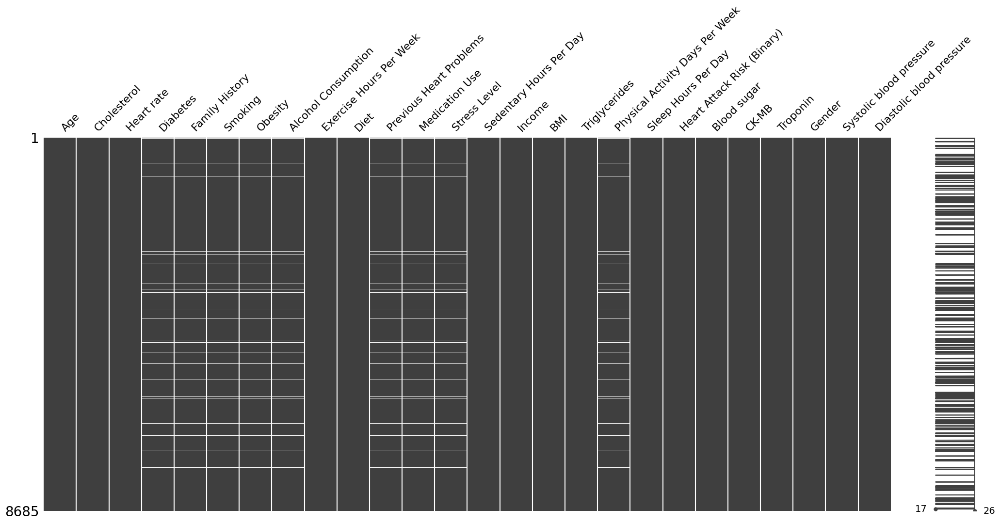

In [18]:
msno.matrix(train_df);

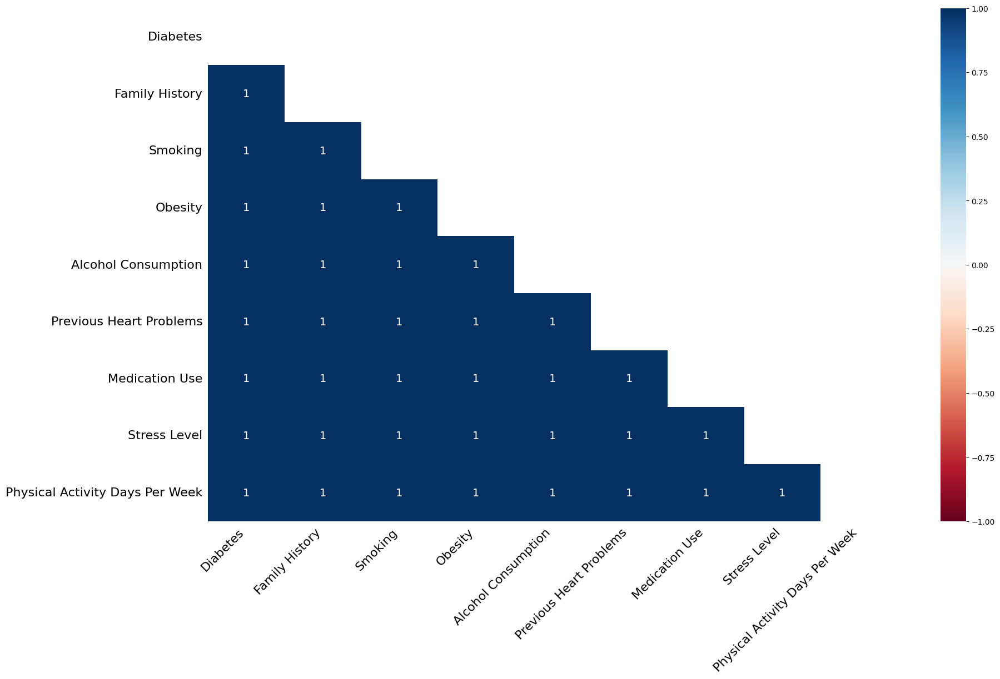

In [19]:
msno.heatmap(train_df);

Пропуски в признаках: Diabetes, Family History, Smoking, Obesity, Alcohol Consumption, Previous Heart Problems, Medication Use, Stress Level, Physical Activity Days Per Week — полностью коррелированы, то есть они расположены в одних и тех же строках. Это указывает на систематическую ошибку в сборе данных (например, незаполненные строки или технический сбой). Поскольку таких строк незначительное количество (<5% от общего объема данных), их можно безопасно удалить.

In [20]:
# удаление строк с пропусками в обоих датафреймах
for df in dataframes.values():
    df.dropna(inplace=True)

Категориальные признаки и количественный дискретный `Physical Activity Days Per Week` типа float преобразуем в str и int для улучшения читаемости и избежания потенциальных проблем с типами данных

In [21]:
# Список категориальных признаков, которые надо преобразовать из float в str
binary_cols = [
    'Diabetes', 'Family History', 'Smoking', 'Obesity',
    'Alcohol Consumption', 'Previous Heart Problems',
    'Medication Use', 'Stress Level', 'Diet'
]

# Преобразование типов в каждом датафрейме
for df in dataframes.values():
    # Оставляем только те колонки, которые существуют в текущем датафрейме
    existing_cols = [col for col in binary_cols if col in df.columns]
    # Преобразуем типы
    df[existing_cols] = df[existing_cols].astype(int).astype(str)

In [22]:
# Преобразования типа целевого бинарного признака
train_df['Heart Attack Risk (Binary)'] = train_df['Heart Attack Risk (Binary)'].astype(str)

In [23]:
# Преобразование типа количественного дискретного признака в каждом датафрейме
for df in dataframes.values():
    # Преобразуем типы
    df['Physical Activity Days Per Week'] = df['Physical Activity Days Per Week'].astype(int)

In [24]:
# Преобразование категориального признака из int в str в каждом датафрейме
for df in dataframes.values():
    # Преобразуем типы
    df['Diet'] = df['Diet'].astype(str)

Проверим корректность выполнения удаления строк с пропусками и преобразование типов данных

In [25]:
# выведем общую информацию о датафреймах
# воспользуемся items() и словарем dataframes для обращения к каждому датафрейму в цикле
for name, df in dataframes.items():
    print(f'\033[1mОбщая информация для {name}:\033[0m')
    df.info()
    print('')

Общая информация для test_df:
<class 'pandas.core.frame.DataFrame'>
Index: 935 entries, 7746 to 6521
Data columns (total 25 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              935 non-null    float64
 1   Cholesterol                      935 non-null    float64
 2   Heart rate                       935 non-null    float64
 3   Diabetes                         935 non-null    object 
 4   Family History                   935 non-null    object 
 5   Smoking                          935 non-null    object 
 6   Obesity                          935 non-null    object 
 7   Alcohol Consumption              935 non-null    object 
 8   Exercise Hours Per Week          935 non-null    float64
 9   Diet                             935 non-null    object 
 10  Previous Heart Problems          935 non-null    object 
 11  Medication Use                   935 non-null    object

Удаление пропусков и преобразование типов прошло успешно

Проанализируем дубликаты во всех датафреймах. Для начала узнаем количество явных дубликатов.

In [26]:
# выведем количество дубликатов в каждом датафрейме
# воспользуемся items() и словарем dataframes для обращения к каждому датафрейму в цикле
for name, df in dataframes.items():
    print(f'\033[1mКоличество явных дубликатов в {name}: {df.duplicated().sum()}\033[0m')

Количество явных дубликатов в test_df: 0
Количество явных дубликатов в train_df: 0


Явные дубликаты отсутствуют. Теперь проверим наличие неявных дубликатов. Для этого выведем уникальные значения всех категориальных признаков.

In [27]:
# выведем уникальные значения для категориальных признаков типа object каждого DataFrame
for name, df in dataframes.items():
    print(f'\033[1mУникальные значения для признаков {name}:\033[0m')
    for column in df.select_dtypes(include='object').columns:
        unique_values = df[column].unique()
        print(f'  \033[1m{column}:\033[0m {unique_values}')
    print('')

Уникальные значения для признаков test_df:
  Diabetes: ['0' '1']
  Family History: ['1' '0']
  Smoking: ['1' '0']
  Obesity: ['1' '0']
  Alcohol Consumption: ['1' '0']
  Diet: ['2' '0' '1']
  Previous Heart Problems: ['0' '1']
  Medication Use: ['0' '1']
  Stress Level: ['8' '5' '10' '7' '1' '4' '9' '6' '3' '2']
  Gender: ['Male' 'Female']

Уникальные значения для признаков train_df:
  Diabetes: ['1' '0']
  Family History: ['1' '0']
  Smoking: ['1' '0']
  Obesity: ['1' '0']
  Alcohol Consumption: ['1' '0']
  Diet: ['1' '2' '0']
  Previous Heart Problems: ['1' '0']
  Medication Use: ['0' '1']
  Stress Level: ['8' '9' '6' '3' '7' '1' '10' '2' '5' '4']
  Heart Attack Risk (Binary): ['0.0' '1.0']
  Gender: ['Male' 'Female']



In [28]:
# выведем уникальные значения для количественного дискретного типа int каждого DataFrame
for name, df in dataframes.items():
    print(f'\033[1mУникальные значения для признаков {name}:\033[0m')
    for column in df.select_dtypes(include='int').columns:
        unique_values = df[column].unique()
        print(f'  \033[1m{column}:\033[0m {unique_values}')
    print('')

Уникальные значения для признаков test_df:
  Physical Activity Days Per Week: [1 0 7 5 3 2 4 6]

Уникальные значения для признаков train_df:
  Physical Activity Days Per Week: [3 2 0 5 6 4 7 1]



Неявные дубликаты отсутствуют

**Промежуточные выводы**

1. Пропуски в признаках наблюдались в определенных строках, доля которых <5% — удалены.
2. Категориальные признаки и количественный дискретный признак типа `float` преобразованы в `object` и `int` соответственно.
3. Дубликаты не обнаружены.

Датафреймы готовы для анализа.

## Исследовательский анализ

Мы имеем дело с двумя датафреймами: `train_df` и `test_df`. Предлагается провести детальный анализ датафрейма `train_df`, а для датафрейма `test_df` проверить распределения на соответствие с распределениями в датасете `train_df`. В случае соответствия распределений будем считать выявленные закономерности на датасете `train_df` актуальными и для датасета `test_df`.

Перед этим проведем обзор литературы, чтобы выявить действительно релевантные признаки, соответствующие цели проекта.

### Обзор литературы

**Основные факторы риска поражения сердца**  
1. **Повышенный уровень холестерина (Cholesterol)**  
   Дислипидемия упоминается как значимый фактор риска в контексте неинфекционных заболеваний, хотя конкретные данные о сердце не приводятся [1].  

2. **Гипертония (Systolic/Diastolic blood pressure)**  
   Высокое артериальное давление прямо указано как корректируемый фактор риска, увеличивающий вероятность осложнений, включая сердечные [2].  

3. **Курение (Smoking)**  
   Курение отмечено как ключевой фактор риска, влияющий на развитие заболеваний, включая повреждение сосудов [3,4].  

4. **Ожирение (Obesity, BMI)**  
   Избыточная масса тела связана с метаболическими нарушениями, такими как дислипидемия и диабет, что усиливает риск сердечно-сосудистых заболеваний [1,5].  

5. **Сахарный диабет (Diabetes)**  
   Диабет упомянут в контексте метаболических расстройств, повреждающих сосуды и увеличивающих сердечный риск [5].  

6. **Недостаточная физическая активность (Exercise Hours Per Week, Sedentary Hours Per Day)**  
   Малоподвижный образ жизни коррелирует с гипертонией и ожирением, что подтверждается в литературе о неинфекционных болезнях [5].  

7. **Стресс (Stress Level)**  
   Хронический стресс включен в список факторов риска, влияющих на воспалительные процессы и нагрузку на сердечно-сосудистую систему [5].  

8. **Наследственность (Family History)**  
   Генетическая предрасположенность упомянута как один из многочисленных факторов риска для неинфекционных заболеваний [5].  

9. **Неправильное питание (Diet)**  
   Питание указано как основной фактор риска (35% по данным ВОЗ), включая влияние жиров и сахара на обмен веществ [3].  

---

**Менее значимые факторы**  
1. **Уровень глюкозы в крови (Blood sugar)**  
   Связан с диабетом и метаболическим синдромом, что подтверждается в обзоре факторов риска для неинфекционных заболеваний [5].  

2. **Триглицериды (Triglycerides)**  
   Высокие значения упомянуты как маркер дислипидемии, хотя конкретные данные о сердечном риске не приведены [6].  

3. **Алкоголь (Alcohol Consumption)**  
   Чрезмерное потребление алкоголя отмечено как фактор риска для печени и сердечно-сосудистой системы [3,4].  

---

**Дополнительные факторы: Age и Gender**  
1. **Возраст (Age)**  
   Возраст является классическим фактором риска ССЗ, так как с его увеличением снижается эластичность сосудов и накапливаются метаболические нарушения. Это подтверждается в литературе о многофакторности неинфекционных заболеваний [5].  

2. **Пол (Gender)**  
   Мужской пол ассоциирован с более высоким риском ранних сердечных заболеваний из-за гормональных и поведенческих различий (например, курение, стресс). Хотя в прямых цитатах это не указано, общий контекст источников поддерживает влияние гендерных особенностей [5].  

---

**Исключенные признаки:**
Heart rate, Medication Use, Income, CK-MB, Troponin, Sleep Hours Per Day, Troponin — либо не упоминаются как прямые факторы риска, либо служат маркерами, а не причинами поражения сердца. Признак Previous Heart Problems исключен из анализа, так как люди, имеющие проблемы с сердцем ранее автоматически имеют риск поражения сердца в настоящем, что будет утечкой целевого признака. Среди признаков Systolic/Diastolic blood pressure достаточно будет одного — Diastolic blood pressure. В датасете имеются две меры оценки физической активности — Exercise Hours Per Week и Physical Activity Days Per Week — остановимся на Exercise Hours Per Week, так как он более точно отражает физическую нагрузку. При необходимости Feature Engineering можно будет подключить исключенные признаки для создания новых.

---

**Промежуточный вывод —** Согласно обзору литературы исключаем малозначимые факторы из анализа и оставляем следующие:

1) количественные признаки: `Diastolic blood pressure`, `BMI`, `Cholesterol`, `Exercise Hours Per Week`, `Age`, `Sedentary Hours Per Day`, `Blood sugar`, `Triglycerides`;

2) категориальные признаки: `Stress Level`, `Diet`, `Family History`, `Diabetes`, `Gender`, `Alcohol Consumption`,  `Smoking`, `Obesity`

---

**Список литературы**

[1] URL: https://lab4u.ru/articles/kholesterin-i-serdechno-sosudistye-zabolevaniya/?utm_source=yandex.ru&utm_medium=organic&utm_campaign=yandex.ru&utm_referrer=yandex.ru

[2] URL: https://www.crbslav.ru/informatsiya-dlya-patsientov/meditsinskaya-profilaktika/272-chto-takoe-fakty-riska

[3] URL: https://www.takzdorovo.ru/profilaktika/faktory-riska/

[4] URL: https://cyberleninka.ru/article/n/vliyanie-faktorov-riska-na-zdorovie-cheloveka

[5] URL: https://rjsocmed.com/1728-2810/article/view/42672/ru_RU

[6] URL: https://medcentr-endomedlab.ru/biohimija_krovi/norma_trigliceridy.html

### Числовое описание данных

<a id='my-data_5'></a>

In [29]:
# копии датафреймов для Feature Engineering
train_df_fe = train_df.copy()
test_df_fe = test_df.copy()


# создаем датасеты со значимыми согласно лит. обзору признаками

train_df = train_df[
    [
        # целевой признак
        'Heart Attack Risk (Binary)',

        # количественные признаки
        'Diastolic blood pressure', 'BMI', 'Cholesterol', 'Exercise Hours Per Week',
        'Age', 'Sedentary Hours Per Day', 'Blood sugar', 'Triglycerides',

        # категориальные признаки
        'Stress Level', 'Diet', 'Family History', 'Diabetes', 'Gender',
        'Alcohol Consumption',  'Smoking', 'Obesity'
    ]
]

test_df = test_df[
    [
        # количественные признаки
        'Diastolic blood pressure', 'BMI', 'Cholesterol', 'Exercise Hours Per Week',
        'Age', 'Sedentary Hours Per Day', 'Blood sugar', 'Triglycerides',

        # категориальные признаки
        'Stress Level', 'Diet', 'Family History', 'Diabetes', 'Gender',
        'Alcohol Consumption',  'Smoking', 'Obesity'
    ]
]

In [30]:
## просмотрим числовое описание данных train_df

# создадим таблицу с числовым описанием данных
pivot_train_df = train_df.describe(include='all')

# добавим рассогласование медианного (medium) и среднего (mean) значений как ((mean-medium)/medium)*100%
# в данном случае берется абсолютная разница (mean-medium) без модуля, чтобы сразу было понятно mean больше или меньше medium
pivot_train_df.loc['mismatch%'] = ((pivot_train_df.loc['mean']-pivot_train_df.loc['50%'])/pivot_train_df.loc['50%'])*100
# добавим соотношение стандартного отклонения к медианному значению в процентах,
# чтобы оценить разброс и сравнить его для всех количественных признаков, так как они отличаются по масштабу
pivot_train_df.loc['rel_std%'] = pivot_train_df.loc['std']/pivot_train_df.loc['mean']*100
# добавим долю наиболее популярного класса в категориальных признаках в процентах,
# чтобы оценить дисбаланс целевого класса
pivot_train_df.loc['cat_top_ratio%'] = pivot_train_df.loc['freq']/pivot_train_df.loc['count']*100

# преобразуем в HTML
styled_table = pivot_train_df.round(2).T.to_html()

print('\033[1mЧисловое описание данных train_df\033[0m')
HTML(styled_table)

Числовое описание данных train_df


,count,unique,top,freq,mean,std,min,25%,50%,75%,max,mismatch%,rel_std%,cat_top_ratio%
Heart Attack Risk (Binary),8442,2,0.0,5429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.309405
Diastolic blood pressure,8442.0,NaN,NaN,NaN,0.5,0.17,0.21,0.35,0.5,0.65,0.79,0.33,33.95,NaN
BMI,8442.0,NaN,NaN,NaN,0.5,0.29,0.0,0.25,0.49,0.74,1.0,1.23,57.69,NaN
Cholesterol,8442.0,NaN,NaN,NaN,0.5,0.29,0.0,0.26,0.5,0.75,1.0,0.94,57.63,NaN
Exercise Hours Per Week,8442.0,NaN,NaN,NaN,0.5,0.29,0.0,0.25,0.51,0.75,1.0,-0.95,57.38,NaN
Age,8442.0,NaN,NaN,NaN,0.45,0.23,0.04,0.25,0.46,0.64,0.85,-2.53,51.85,NaN
Sedentary Hours Per Day,8442.0,NaN,NaN,NaN,0.5,0.29,0.0,0.25,0.49,0.75,1.0,1.3,57.98,NaN
Blood sugar,8442.0,NaN,NaN,NaN,0.23,0.07,0.0,0.23,0.23,0.23,1.0,0.43,32.73,NaN
Triglycerides,8442.0,NaN,NaN,NaN,0.51,0.29,0.0,0.26,0.51,0.76,1.0,-0.44,57.45,NaN
Stress Level,8442,10,7,869,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.293769


Из числового анализа видно, что `Blood sugar` имеет первый, второй и третий квартили одинаковые, что указывает на особенность в данных. Исследуем уникальные значения.

In [31]:
print('Доля уникальных значений в Blood sugar тренировочной выборки')
(train_df['Blood sugar'].value_counts()/len(train_df)).head()

Доля уникальных значений в Blood sugar тренировочной выборки


Blood sugar
0.227018    0.776001
0.102767    0.006160
0.128458    0.006160
0.116601    0.005804
0.124506    0.004975
Name: count, dtype: float64

In [32]:
print('Доля уникальных значений в Blood sugar тестовой выборки')
(test_df['Blood sugar'].value_counts()/len(test_df)).head()

Доля уникальных значений в Blood sugar тестовой выборки


Blood sugar
0.227018    0.776471
0.128458    0.010695
0.124506    0.008556
0.114625    0.007487
0.136364    0.006417
Name: count, dtype: float64

Из распределения уникальных значений `Blood sugar` видно, что 0.78 людей в выборках имеют значение `Blood sugar` равное 0.23 усл. ед. Вероятно, это говорит об отсутствии объективности при сборе данных касательно признака `Blood sugar`.

**Анализ числового описания данных `train_df`**

**Ключевой момент —** численные признаки масштабированы, что усложняет анализ выбросов и аномалий, а также Feature Engineering.

1. **Несбалансированность целевого признака**  
   - **64.3%** случаев соответствуют отсутствию риска (`Heart Attack Risk = 0`).  
   - **Рекомендации**:  
     - Использовать метрики, устойчивые к несбалансированности (например, AUC-ROC, F1-score).  
     - Применить техники балансировки классов (например, веса классов).  

2. **Разброс в количественных признаках**  
   - **Высокий разброс**:  
     - `Exercise Hours Per Week` (rel_std% = 57.38%), `Sedentary Hours Per Day` (rel_std% = 57.98%) и т.д.
    
3. **Важные признаки-факторы риска**  
   - **Категориальные**:  
     - `Smoking` (90.29% курят), `Diabetes` (65.2% имеют диабет), `Obesity` (50.16% без ожирения).  
   - **Количественные**:  
     - `BMI` (rel_std% = 57.69%), `Stress Level` (10.29%), `Blood sugar` (32.73%), `Age` (51.85%).  
   - **Рекомендации**:  
     - Закодировать категориальные признаки.  
     - Учесть взаимосвязь между признаками (например, `BMI` и `Obesity`).  

4. **Потенциальная мультиколлинеарность**  
   - Возможная корреляция между `BMI` и `Obesity`, `Cholesterol` и `Triglycerides`, `Blood sugar` и `Triglycerides`.  
   - **Рекомендации**:  
     - Проверить корреляционную матрицу.  
     - Удалить один из коррелированных признаков, если это улучшит метрики.  

5. **Обработка категориальных признаков**  
   - `Gender`: 69.67% — мужчины. Возможно, пол влияет на риск.  
   - `Diet`: 3 категории, самая частая 1 — 34%.  
   
6. **Специфические особенности признаков**  
   - У большинства количественных признаков высокий разброс (rel_std% = 52–58%) и почти симметричное распределение, что хорошо для предсказательной способности модели (однако, учитывая, что данные масштабированы, нельзя сделать конкретный вывод насколько спектр данных широкий)  
   - `Blood sugar`: 0.78 людей в выборках имеют одинаковое значение `Blood sugar`, что указывает на отсутствие объективности при сборе данных касательно признака `Blood sugar`.

---

**Рекомендации для дальнейшей работы:**
- **Модели**:  
  - Использовать алгоритмы, которые могут быть адаптированы к несбалансированности .
  - Применить техники балансировки классов (веса классов (пример — `class_weight='balanced'`))
  - Проверить важность признаков через feature importance.
  - Поэкспериментировать с набором признаков согласно проведенным исследованиям данных (например, убрать признак `Blood sugar` из-за отсутствия объективности)
- **Оценка**:  
  - Использовать стратифицированную кросс-валидацию и метрику AUC-ROC для выбора лучшей модели.

Стратифицированная кросс-валидация гарантирует, что пропорции классов целевого признака в каждом фолде будут такими же, как и в исходных данных. Метрика `ROC-AUC` менее чувствительна к дисбалансу классов и при этом объективно сравнивает разные модели, так как она измеряет общую способность модели ранжировать примеры, а также имеет независимость от порога классификации.

Эти шаги помогут создать эффективную модель прогнозирования риска инфаркта, учитывая специфику данных.

Далее рассмотрим взаимосвязи между признаками с помощью графиков. Будем сразу делать срезы и анализ по разным категориям. Отобразим диаграммы размаха для непрерывных признаков, чтобы продемонстрировать как расположены данные и их разброс. Гистограммы будем использовать для непрерывных признаков, чтобы выяснить как для каждого признака данные распределены между собой.

### Распределения количественных признаков в зависимости от категориального

In [33]:
print(plot_distribution_with_boxplot.__doc__)

Визуализирует распределения признаков с разделением по категориям целевой переменной.

    Автоматически преобразует числовые целевые переменные в категориальные,
    если они содержат ≤10 уникальных значений. Это преобразование не влияет на исходный датафрейм.

    Создает сетку графиков:
    - Для каждого признака отображаются 2 строки:
      1) Гистограмма с наложениями категорий (stacked) и KDE-кривой
      2) Горизонтальный boxplot, где категории размещены по оси y
    - Цвета категорий согласованы между графиками и указаны в легенде
    - Графики автоматически размещаются в сетке (до 4 столбцов)
    - Убираются пустые оси для незаполненных ячеек сетки
    - Настройки: сетка, поворот меток, оптимизация макета

    Args:
        df (pd.DataFrame): DataFrame с данными
        features (List[Tuple[str, str]]): Список кортежей (колонка, человекочитаемая метка)
        target_col (str): Название целевой колонки. Если тип числовой и содержит ≤10 уникальных значений,
                    

#### Категориальный признак — `Stress Level`

#### Категориальный признак — `Diet`

#### Категориальный признак — `Smoking`

<a id='my-data_1'></a>

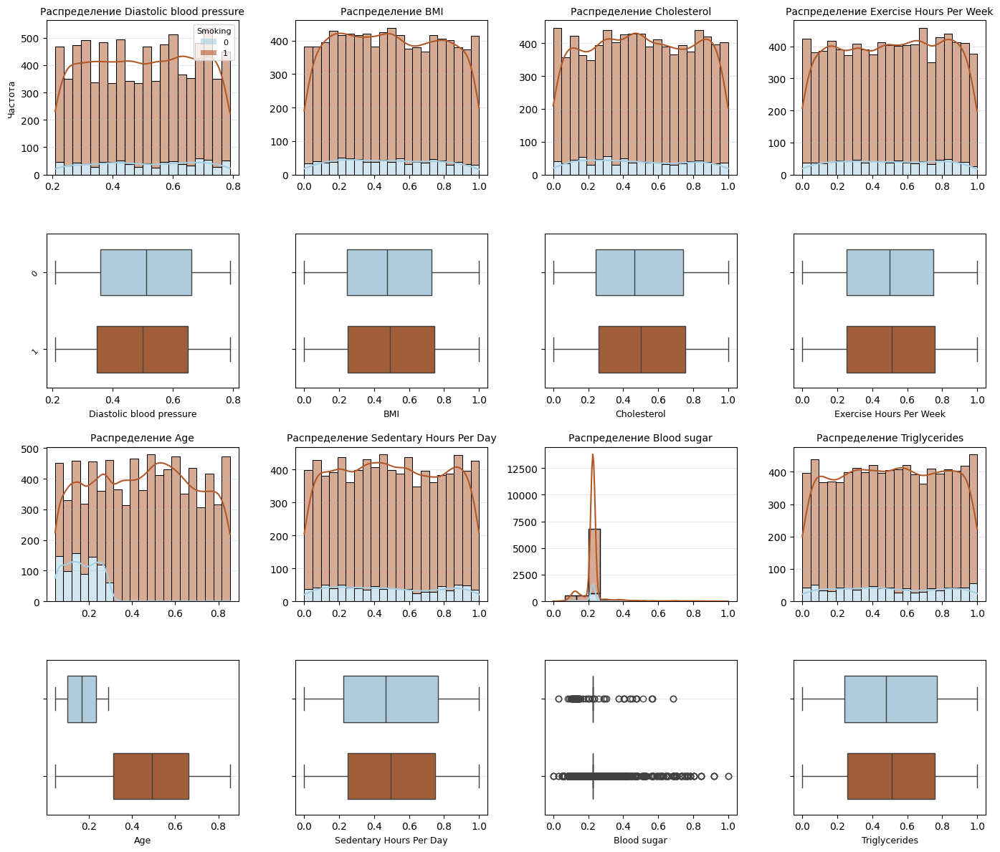

CPU times: total: 688 ms
Wall time: 1.72 s


In [40]:
%%time
# Применение функции plot_distribution_with_boxplot к количественным непрерывным признакам
features = [
    ('Diastolic blood pressure', 'Diastolic blood pressure'),
    ('BMI', 'BMI'),
    ('Cholesterol', 'Cholesterol'),
    ('Exercise Hours Per Week', 'Exercise Hours Per Week'),
    ('Age', 'Age'),
    ('Sedentary Hours Per Day', 'Sedentary Hours Per Day'),
    ('Blood sugar', 'Blood sugar'),
    ('Triglycerides', 'Triglycerides')
]

plot_distribution_with_boxplot(
    train_df,
    features,
    'Smoking'
)

#### Категориальный признак — `Obesity`

<a id='my-data_2'></a>

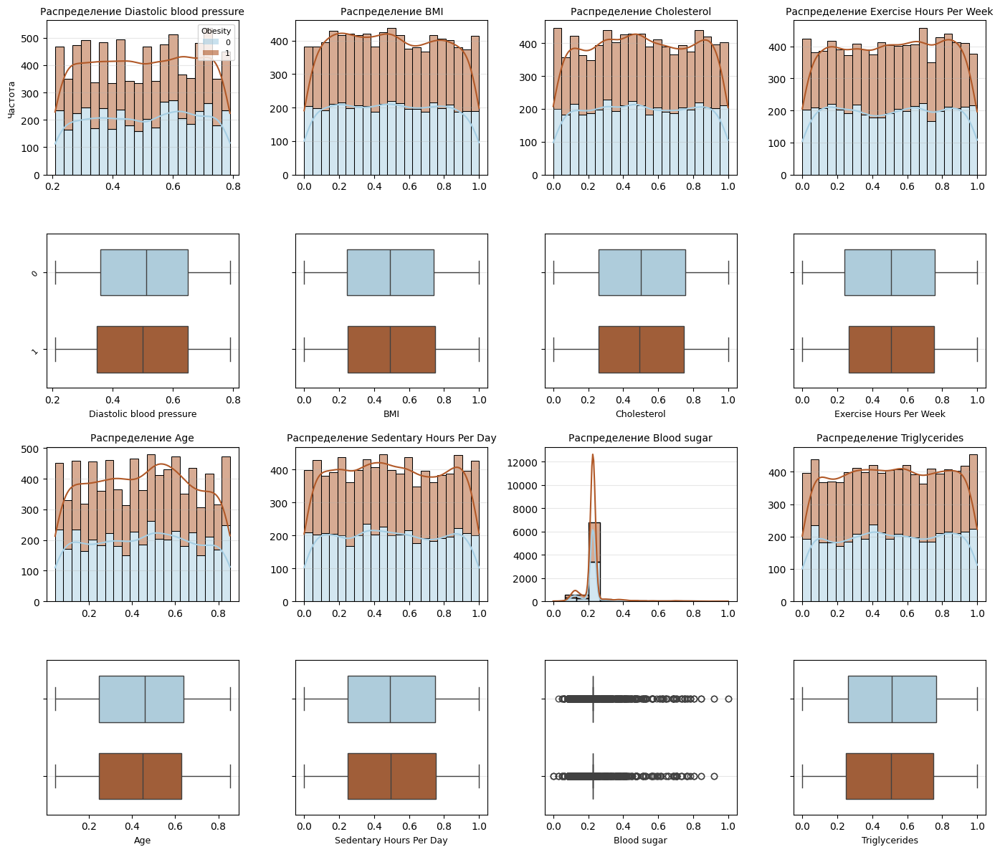

CPU times: total: 531 ms
Wall time: 1.56 s


In [41]:
%%time
# Применение функции plot_distribution_with_boxplot к количественным непрерывным признакам
features = [
    ('Diastolic blood pressure', 'Diastolic blood pressure'),
    ('BMI', 'BMI'),
    ('Cholesterol', 'Cholesterol'),
    ('Exercise Hours Per Week', 'Exercise Hours Per Week'),
    ('Age', 'Age'),
    ('Sedentary Hours Per Day', 'Sedentary Hours Per Day'),
    ('Blood sugar', 'Blood sugar'),
    ('Triglycerides', 'Triglycerides')
]

plot_distribution_with_boxplot(
    train_df,
    features,
    'Obesity'
)

#### Категориальный признак — `Heart Attack Risk (Binary)`

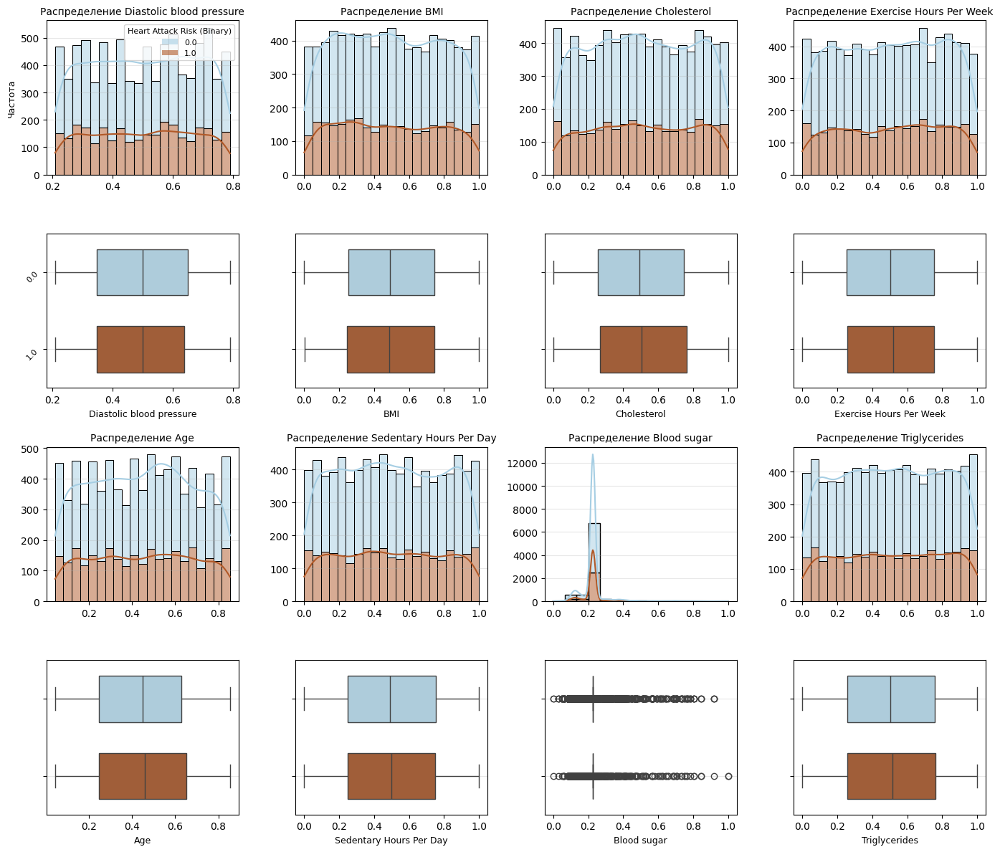

CPU times: total: 875 ms
Wall time: 2.02 s


In [42]:
%%time
# Применение функции plot_distribution_with_boxplot к количественным непрерывным признакам
features = [
    ('Diastolic blood pressure', 'Diastolic blood pressure'),
    ('BMI', 'BMI'),
    ('Cholesterol', 'Cholesterol'),
    ('Exercise Hours Per Week', 'Exercise Hours Per Week'),
    ('Age', 'Age'),
    ('Sedentary Hours Per Day', 'Sedentary Hours Per Day'),
    ('Blood sugar', 'Blood sugar'),
    ('Triglycerides', 'Triglycerides')
]

plot_distribution_with_boxplot(
    train_df,
    features,
    'Heart Attack Risk (Binary)'
)

#### Промежуточные выводы

1. В целом каких-то существенных различий в распределениях в зависимости от категориальных признаков нет, однако можно еще раз отметить широкий разброс и преимущественно симметричные распределения, что хорошо для предсказательной способности модели (однако, учитывая, что данные масштабированы, нельзя сделать конкретный вывод насколько спектр данных широкий).
2. Обнаружено, что некурящие с возрастом до 0.3 усл. единиц; у курящих сахар в крови может быть повышенным согласно наличию выбросов еще больших значений, однако в датасете их доля значительно больше, чем некурящих, что не дает сделать конкретный вывод (для анализа можно провести t-тест) ([Перейти к разделу "Категориальный признак — `Smoking`"](#my-data_1)).
3. Касательно возможной корреляции между `BMI` и `Obesity`, то различий в распределениях признака `BMI` для разных значений `Obesity` не выявлено. Ожидалось, что с увеличением показателя `BMI` будет увеличиваться доля людей с ожирением ([Перейти к разделу "Категориальный признак — `Obesity`"](#my-data_2)).

### Распределения количественных признаков в зависимости от двух категориальных

In [43]:
print(plot_violin_combinations.__doc__)


    Строит комбинации violinplot для заданных/автоматически определённых категориальных признаков.

    Parameters:
    -----------
    df : pd.DataFrame
        Входной датафрейм с данными.
    x_column : str, optional (default='Age')
        Имя непрерывного числового признака для оси X (например, возраст).
    y_features : list, optional (default=None)
        Список категориальных признаков для оси Y.
        Должны быть нечисловыми типами (object, category).
        Если None, определяются автоматически:
        - Объектные столбцы с 2–10 уникальными значениями.
    hue_features : list, optional (default=None)
        Список бинарных категориальных признаков для разделения (hue).
        Если None, определяются автоматически:
        - Объектные/числовые столбцы с ровно 2 уникальными значениями.
    max_classes : int, optional (default=10)
        Максимальное количество уникальных значений для признаков на оси Y (по умолчанию до 10).

    Returns:
    --------
    None
        В

#### Числовой признак — `Diastolic blood pressure`

#### Числовой признак — `BMI`

#### Числовой признак — `Cholesterol`

<a id='my-data_3'></a>

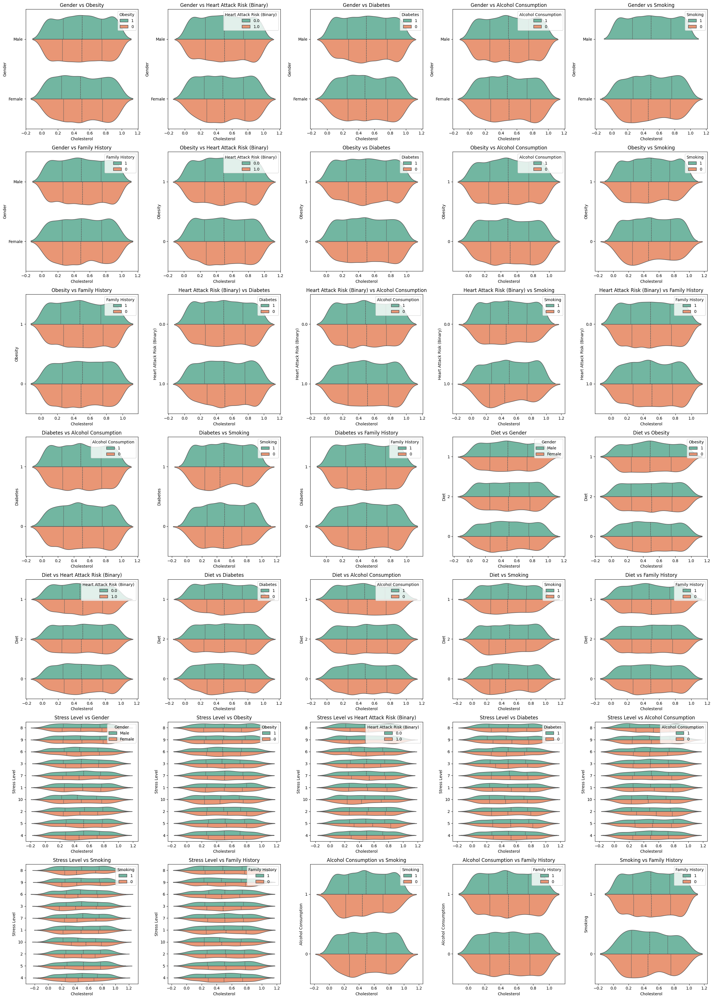

CPU times: total: 2.05 s
Wall time: 5.08 s


In [46]:
%%time
# Вызов функции
plot_violin_combinations(train_df, x_column='Cholesterol')

#### Числовой признак — `Exercise Hours Per Week`

#### Числовой признак — `Age`

<a id='my-data_4'></a>

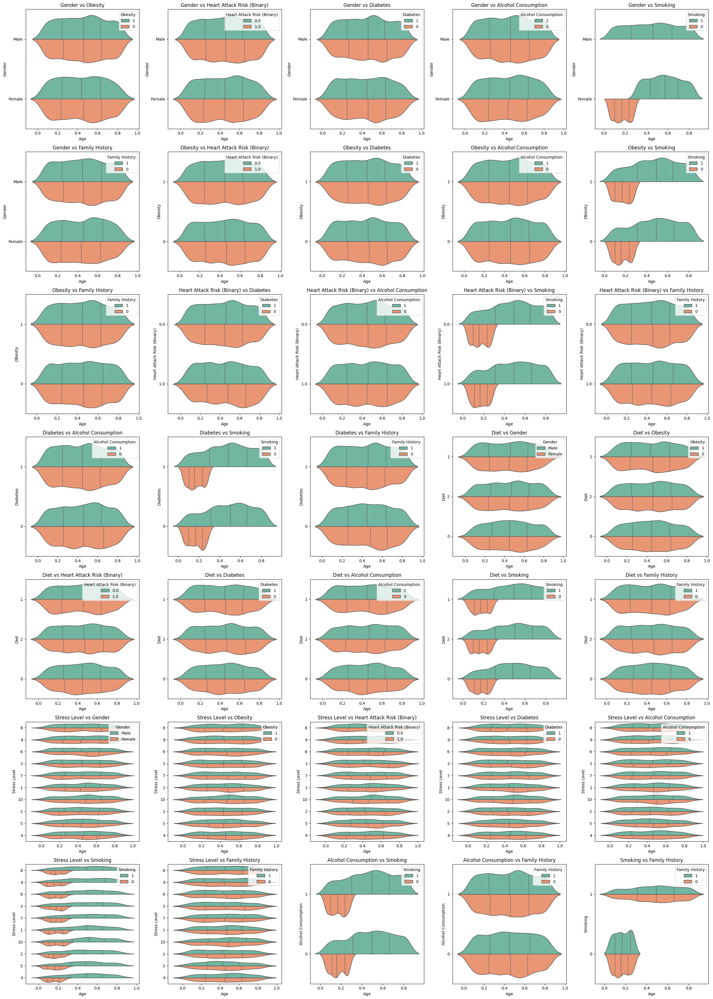

CPU times: total: 2.08 s
Wall time: 6.81 s


In [48]:
%%time
# Вызов функции
plot_violin_combinations(train_df, x_column='Age')

#### Числовой признак — `Sedentary Hours Per Day`

#### Числовой признак — `Blood sugar`

#### Числовой признак — `Triglycerides`

#### Промежуточные выводы

1. На данных срезах видны некоторые зависимости, которые поддаются логическому объяснению, что однозначно сыграет положительную роль для предсказательной способности модели.
2. Первый пример — для выборки без курящих с усилением диеты доля людей с пониженным холестерином увеличивается, а в случае курящих диета слабо влияет на ситуацию [Перейти к разделу "Числовой признак — `Cholesterol`"](#my-data_3). Известно, что курение способствует повышению уровня холестерина в крови, поэтому диета и не оказывает значительного положительного эффекта для выборки с курящими [URL: https://www.rsp-ufa.ru/images/tab%20at.pdf].
3. Второй пример — максимальная доля людей без диабета смещается в сторону увеличения возраста по мере усиления диеты: диета 0 — 0.4 усл. ед. возраста, диета 1 — 0.55 усл. ед. возраста, диета 2 — 0.6 усл. ед возраста [Перейти к разделу "Числовой признак — `Age`"](#my-data_4). Известно, что сбалансированное питание играет ключевую роль в профилактике диабета [URL: https://www.diabetesaustralia.com.au/living-with-diabetes/healthy-eating/].
4. Важно отметить отсутствие некурящих мужчин, что говорит об отсутствии объективности в данных о курении.

### Связь целевого бинарного пирзнака с категориальными

In [52]:
print(plot_categorical_distributions.__doc__)


    Строит распределение категориальных признаков относительно бинарного целевого признака.

    Args:
        df (pd.DataFrame): Входной датафрейм с данными.
        target_col (str): Название целевого бинарного признака.
        categorical_features (list, optional): Список категориальных признаков для отображения.
            Если None, автоматически определяются все категориальные колонки в df (типы 'object' или 'category').

    Raises:
        ValueError: Если целевой столбец отсутствует в df или не является бинарным.
        KeyError: Если указанные категориальные признаки отсутствуют в df.

    Example:
        >>> plot_categorical_distributions(df, 'Heart Attack Risk (Binary)', ['Gender', 'Smoking'])
    


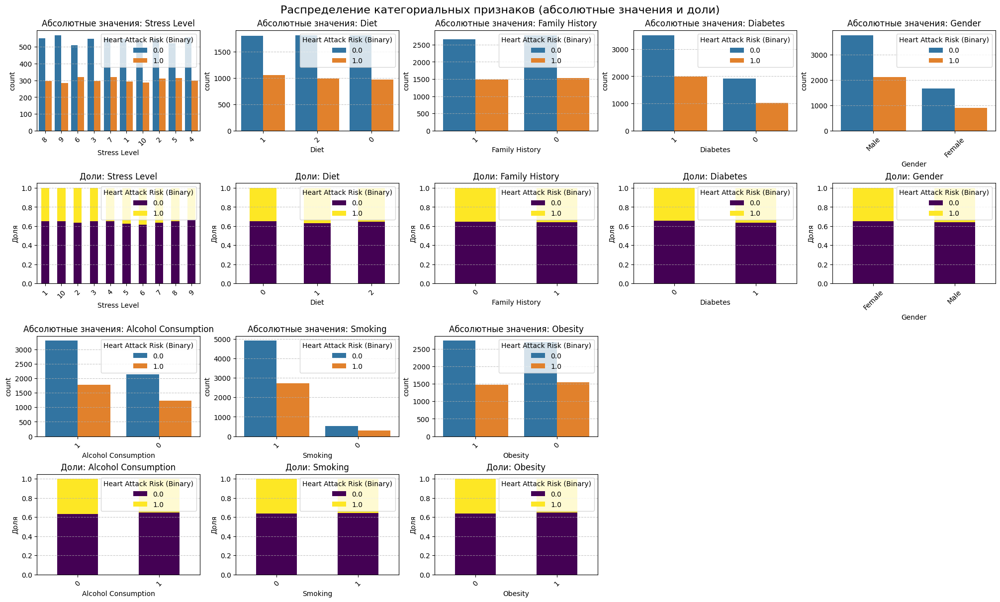

In [53]:
# Используем собственную функцию plot_categorical_distributions
plot_categorical_distributions(train_df, 'Heart Attack Risk (Binary)')

Мы наблюдаем, что целевой признак слабо связан с категориальными.

### Диаграммы рассеяния для всех пар числовых признаков в зависимости от класса целевого признака

In [54]:
print(plot_scatter_by_class.__doc__)


    Строит диаграммы рассеяния для всех пар числовых признаков,
    разделяя точки по классам целевого бинарного признака.

    Параметры:
    df (pd.DataFrame): датафрейм с данными
    target (str): имя целевого бинарного признака
    features (list of str, optional): список числовых признаков для анализа.
                                      Если None, используются все числовые признаки, кроме целевого.

    Пример использования:
    >>> plot_scatter_by_class(df, 'target', features=['age', 'income'])
    


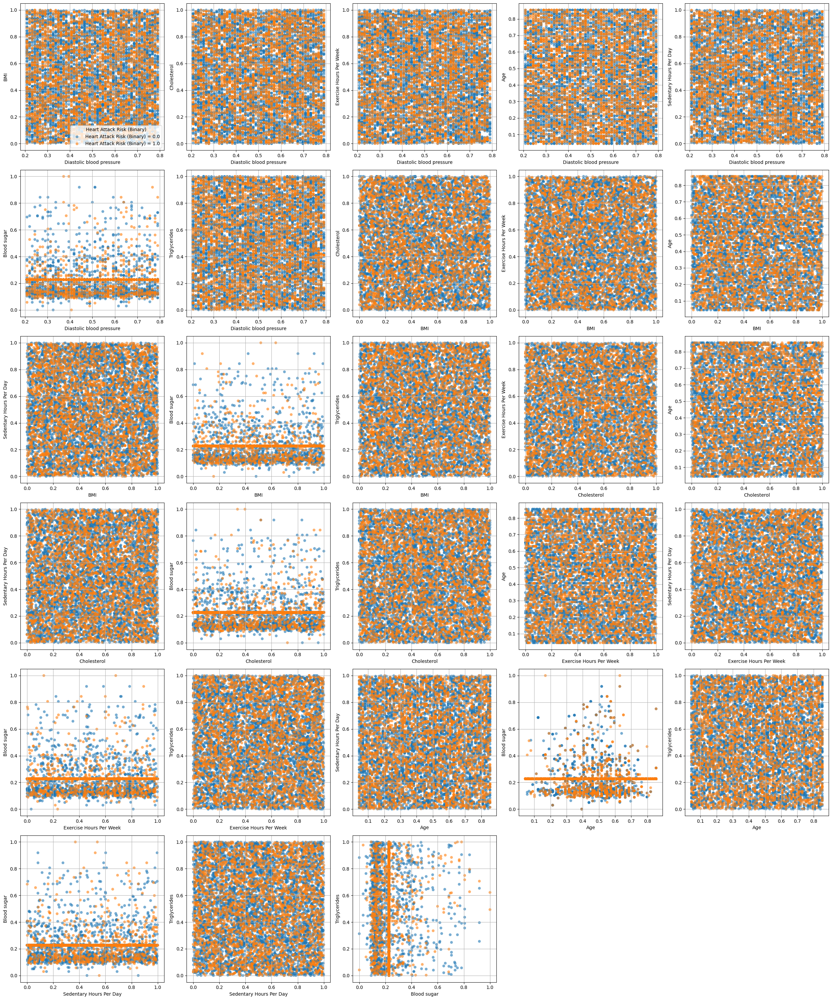

In [55]:
plot_scatter_by_class(train_df, 'Heart Attack Risk (Binary)')

Мы наблюдаем, что целевой признак слабо влияет на связь числовых признаков. Отметим, что обнаружена аномалия для признака `Blood sugar` — одинаковое значение для множества людей — которая выявлена ранее в разделе `Числовое описание данных`. [Перейти к разделу "Числовое описание данных"](#my-data_5)

### Промежуточные выводы по исследовательскому анализу

**Рекомендации для дальнейшей работы:**
- **Модели**:  
  - Использовать алгоритмы, которые могут быть адаптированы к несбалансированности .
  - Применить техники балансировки классов (веса классов (пример — `class_weight='balanced'`))
  - Проверить важность признаков через feature importance.
  - Поэкспериментировать с набором признаков согласно проведенным исследованиям данных (например, убрать признак `Blood sugar` из-за отсутствия объективности)
- **Оценка**:  
  - Использовать стратифицированную кросс-валидацию и метрику AUC-ROC для выбора лучшей модели.


## Корреляционный анализ

Проведем корреляционный анализ признаков в датафрейме `train_df` для моделирования. Будем рассчитывать Phik-коэффициенты, так как планируется обучать в числе прочего нелинейные модели. Такой метод является универсальным и подходит для любых типов данных: числовых, категориальных или их сочетания. Поэтому будем рассчитывать Phik-коэффициенты для всех признаков датафрейма.

Используем созданную функцию для построения матрицы корреляции Phik и датафрейма с отсортированными строками по значению коэффициента по убыванию, но превышающему порог, устанавливаемый пользователем. Будем считать, что присутствует мультиколлинеарность, если хотя бы у одной пары признаков коэффициент Phik будет больше или равен 0.9. В качестве порога в функции выберем 0.9, чтобы можно было бы сразу вывести пары признаков с мультиколлинеарностью.

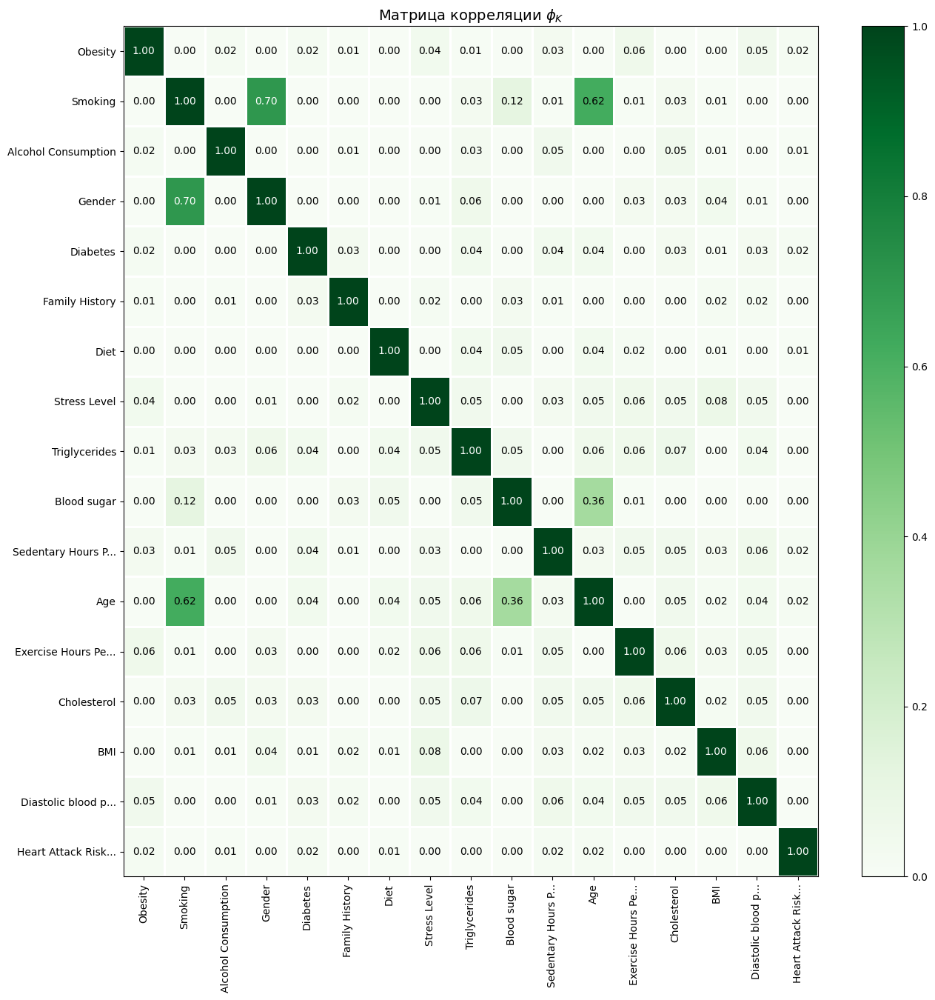

Мультиколлинеарность между парами входных признаков отсутствует


In [56]:
# рассчитаем матрицу корреляции Phik
# присвоем переменной phik_sorted датафрейм с парами признаков и их корреляцией Фи
# присвоем переменной threshold пороговое значение
# присвоем переменной interval_cols список названий всех столбцов с числовым типом данных в обрабатываемом датафрейме
phik_sorted, interval_cols = phik_correlation_matrix(train_df, threshold = 0.9, output_interval_cols=True)

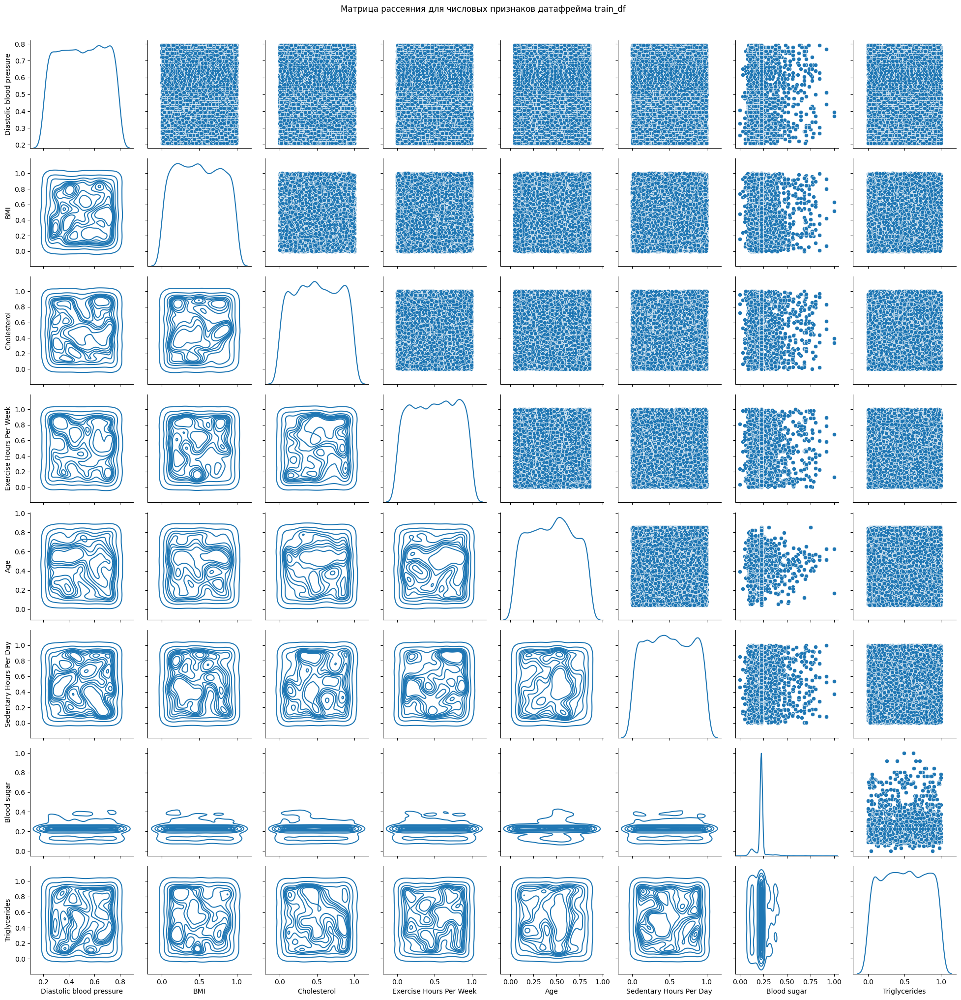

CPU times: total: 43.8 s
Wall time: 1min 31s


In [57]:
%%time
# строим матрицу рассеяния с помощью PairGrid
g = sns.PairGrid(train_df, diag_sharey=False)
g.map_upper(sns.scatterplot)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot)

# добавляем название диаграммы
g.fig.suptitle('Матрица рассеяния для числовых признаков датафрейма train_df', y=1.02)  # увеличиваем значение y, чтобы поднять заголовок)

# показываем диаграмму
plt.show()

Наблюдаем слабую корреляцию с целевым признаком.

**Коэффициент инфляции дисперсии (variance inflation factor — VIF)** измеряет насколько сильно дисперсия коэффициента регрессии увеличивается из-за мультиколлинеарности. Различают следующие категории мультиколлинеарности по значению VIF:
- вблизи 1 — отсутствует или пренебрежимо слабая;
- больше 5–10 — умеренная или сильная (требует внимания);
- больше 100 — критическая (модель ненадежна).

Используем созданную фукнцию `vif_` для расчета коэффициентов инфляции диспресии и рассчитаем их для всех входных признаков датафрейма `train_df`.

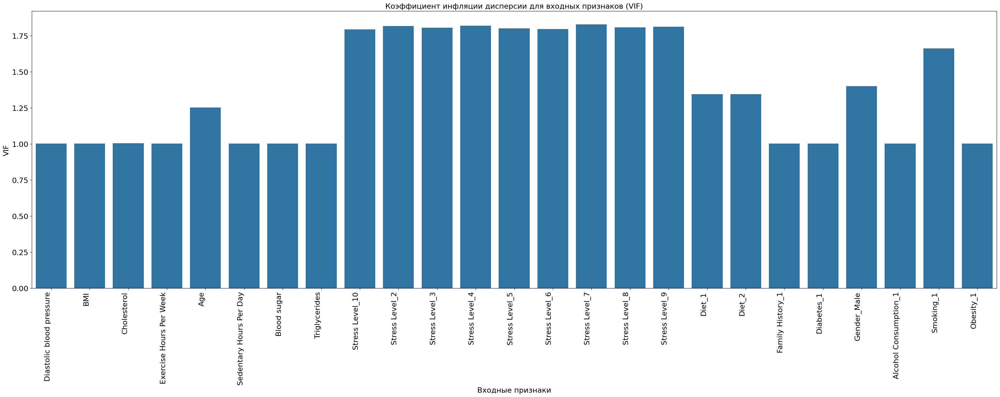

In [58]:
# используем созданную функцию рассчета VIF
vif_(train_df.drop(columns=['Heart Attack Risk (Binary)']), font_size=16)

**Промежуточные выводы по корреляционному анализу**

1. В целом наблюдаются слабые парные корреляции, что подтверждает результаты исследовательского анализа.
2. Мультиколлинеарность отсутствует.
3. В качестве рекомендации можно рассмотреть Feature Engineering для создания новых признаков с лучшей корреляцией с целевым признаком.

## Проверка согласованности тренировочной и тестовой выборок

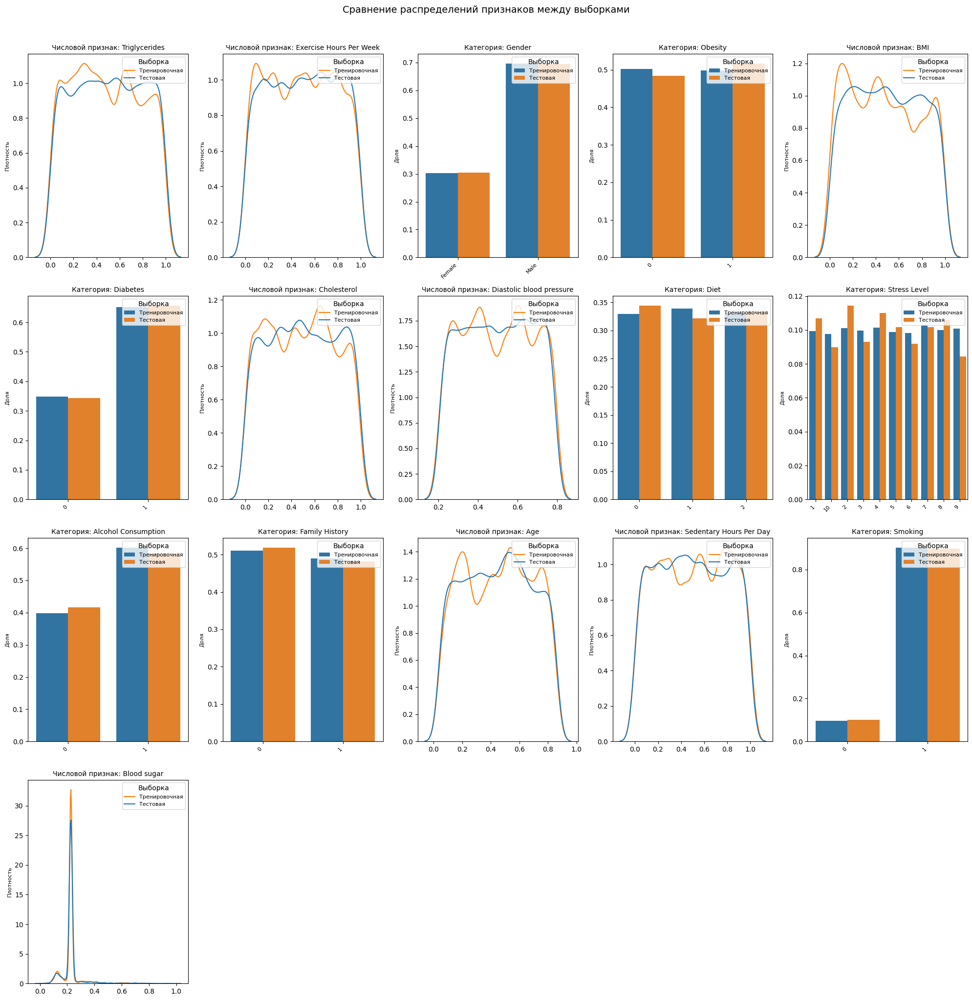

In [59]:
# удаляем целевой признак из тренировочной выборки
train_df_copy = train_df.drop('Heart Attack Risk (Binary)', axis=1)

# применяем собственную функцию compare_distributions к датафреймам train_df_copy и test_df
compare_distributions(train_df_copy, test_df, n_cols=5)

Распределения тренировочного и тестового датасетов одинаковы, поэтому будем считать выявленные закономерности на датасете `train_df` актуальными и для датасета `test_df`.

## Подготовка данных к моделированию

Дополнительные исследования, которые не представлены в данном `Jupyter Notebook`, имели следующий порядок действий:

1. Проведено моделирование с набором признаков, который сформирован на основе обзора литературы, с использованием разных моделей и сильно ограниченного набора гиперпараметров для каждой модели. Лучшей по метрикам среди них оказалась модель `CatBoostClassifier`. Используемый для этой задачи код представлен в разделе `"Общий пайплайн — оценка"`. Отличие только в том, что использовались все признаки отобранные при проведении обзора литературы. [Перейти к разделу "Общий пайплайн — оценка"](#my-data_6)
2. Далее с использованием `RandomizedSearchCV`, бОльшего разнообразия гиперпараметров и более широкого спектра их значений установлены значения гиперпараметров для модели `CatBoostClassifier`, демонстрирующие лучшие метрики. Весь диапазон варьируемых значений гиперпараметров представлен в комментариях к коду в разделе `"Модель CatBoostClassifier"`. [Перейти к разделу "Модель CatBoostClassifier"](#my-data_7)
3. После чего проводились эксперименты с набором признаков при использовании отобранных гиперпараметров: последовательно удалялись перечисленные далее признаки, а потом рассматривались разные комбинации признаков. В результате лучшие метрики достигались при отсутствии следующих признаков: `Smoking`, `Obesity`, `Blood sugar`. Возможные причины: `Smoking` — слабая важность для предсказательной способности модели и необъективные данные (отсутстиве некурящих мужчин); `Obesity` — среди признаков уже есть `BMI`, который является непрерывным количественным признаком и согласно логике более детально характеризует состояние массы тела по отношению к риску поражения сердца, поэтому `Obesity` может быть избыточен; `Blood sugar` — 78% данных имеют в этом непрерывном количественном признаке одно и тоже значение, что характеризует его как необъективный.

Описанные выше дополнительные исследования позволили выявить модель, ее гиперпараметры и набор признаков, которые позволяют продемонстрировать удовлетворительные для цели проекта метрики.

In [60]:
# создаем датасет со значимыми согласно лит. обзору и логике признаками

train_df_1 = train_df[
    [
        # целевой признак
        'Heart Attack Risk (Binary)',

        # количественные признаки
        'Diastolic blood pressure', 'BMI', 'Cholesterol', 'Exercise Hours Per Week',
        'Age', 'Sedentary Hours Per Day', 'Triglycerides',

        # категориальные признаки
        'Stress Level', 'Diet', 'Family History', 'Diabetes', 'Gender',
        'Alcohol Consumption'
    ]
]

In [61]:
train_df_1['Gender'] = train_df_1['Gender'].map({'Male': '0', 'Female': '1'})

In [62]:
# создаем датасет со значимыми согласно лит. обзору признаками и логике
test_df_1 = test_df[
    [
        # количественные признаки
        'Diastolic blood pressure', 'BMI', 'Cholesterol', 'Exercise Hours Per Week',
        'Age', 'Sedentary Hours Per Day', 'Triglycerides',

        # категориальные признаки
        'Stress Level', 'Diet', 'Family History', 'Diabetes', 'Gender',
        'Alcohol Consumption'
    ]
]

In [63]:
test_df_1['Gender'] = test_df_1['Gender'].map({'Male': '0', 'Female': '1'})

In [64]:
# создаем списки с названиями признаков
ord_columns = [
    'Stress Level', 'Diet', 'Family History', 'Diabetes',
    'Gender', 'Alcohol Consumption'
]

num_columns = [
    'Diastolic blood pressure', 'BMI', 'Cholesterol',
    'Exercise Hours Per Week', 'Age', 'Sedentary Hours Per Day',
    'Triglycerides'
    ]

In [65]:
# делим данные на тренировачную и валиадционную выборки
X_train, X_valid, y_train, y_valid = train_test_split(
    train_df_1.drop(['Heart Attack Risk (Binary)'], axis=1),
    train_df_1['Heart Attack Risk (Binary)'],
    test_size = TEST_SIZE,
    random_state = RANDOM_STATE,
    stratify = train_df_1['Heart Attack Risk (Binary)'])

In [66]:
# используем LabelEncoder для кодирования целевого признака
# инициализируем LabelEncoder
le = LabelEncoder()
le.fit(['0.0', '1.0']) # Фиксируем порядок
# кодируем целевой признак тренировочной выборки
y_train = le.transform(y_train)
# кодируем целевой признак валиадционной выборки
y_valid = le.transform(y_valid)

In [67]:
# создаем пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'],
                    ['0', '1', '2'],
                    ['0', '1'],
                    ['0', '1'],
                    ['0', '1'],
                    ['0', '1']
                ],
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

# создаем общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ord', ord_pipe, ord_columns),
     ('num', MinMaxScaler(), num_columns),
    ],
    verbose_feature_names_out=False,  # <-- Сохраняем простые имена
    remainder='passthrough'
)
data_preprocessor.set_output(transform="pandas")  # <-- Сохраняет имена признаков

ColumnTransformer(remainder='passthrough',
                  transformers=[('ord',
                                 Pipeline(steps=[('simpleImputer_before_ord',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('ord',
                                                  OrdinalEncoder(categories=[['1',
                                                                              '2',
                                                                              '3',
                                                                              '4',
                                                                              '5',
                                                                              '6',
                                                                              '7',
                                                                              '8',
                                                                              '9',
                                                                              '10'],
                                                                             ['0',
                                                                              '1',
                                                                              '2'],
                                                                             ['0',
                                                                              '1'],
                                                                             ['0',
                                                                              '1'],
                                                                             ['0',
                                                                              '1'],
                                                                             ['0',
                                                                              '1']],
                                                                 handle_unknown='use_encoded_value',
                                                                 unknown_value=nan)),
                                                 ('simpleImputer_after_ord',
                                                  SimpleImputer(strategy='most_frequent'))]),
                                 ['Stress Level', 'Diet', 'Family History',
                                  'Diabetes', 'Gender',
                                  'Alcohol Consumption']),
                                ('num', MinMaxScaler(),
                                 ['Diastolic blood pressure', 'BMI',
                                  'Cholesterol', 'Exercise Hours Per Week',
                                  'Age', 'Sedentary Hours Per Day',
                                  'Triglycerides'])],
                  verbose_feature_names_out=False)

## Обучение моделей

### Общий пайплайн — оценка

<a id='my-data_6'></a>

In [68]:
# создаем итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

In [69]:
# Создаем scorer для специфичности
specificity = make_scorer(specificity_score)

Проведем кросс-валидацию для установления лучшей модели и ее лучших гиперпараметров

In [70]:
# Рассчитаем вес положительного класса
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

# настроим сетку гиперпараметров
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(
            random_state=RANDOM_STATE,
            class_weight='balanced'
        )],
        'models__max_depth': range(3, 8, 2),
        'models__max_features': range(3, 8, 2),
        'preprocessor__num': ['passthrough']
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE,
            solver='liblinear', # алгоритм оптимизации
            penalty='l1', # тип регуляризации Lasso (обнуляет неважные коэффициенты)
            class_weight='balanced'
        )],
        'models__C': [0.01, 0.1, 1, 10], # коэффициент регуляризации
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели SVC()
    {
        'models': [SVC(
            probability=True,
            class_weight='balanced'
        )],
        'models__kernel': ['linear', 'rbf'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
    },

    # словарь для модели CatBoostClassifier()
    {
        'models': [CatBoostClassifier(
            random_state=RANDOM_STATE,
            scale_pos_weight=scale_pos_weight,
            verbose=0  # отключает внутренний вывод логов
        )],
        'models__iterations': [50, 100, 200],       # количество деревьев
        'models__learning_rate': [0.01, 0.1, 0.2],  # шаг градиентного спуска
        'models__depth': [4, 6, 8],                # глубина деревьев
        'models__l2_leaf_reg': [1, 3, 5],       # коэффициент L2-регуляризации
        'preprocessor__num': ['passthrough']       # CatBoost не требует масштабирования
    }
]

# создадим стратифицированный сплит
cv = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=RANDOM_STATE
)

# настроим RandomizedSearchCV для поиска лучшей модели
randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    cv=cv,
    scoring={
            'specificity': specificity,
            'roc_auc': 'roc_auc',
            'recall': 'recall'
    },
    refit='roc_auc',
    random_state=RANDOM_STATE,
    n_jobs=-1,
    n_iter=30
)

In [71]:
%%time
# Обучение и поиск лучших параметров
randomized_search.fit(X_train, y_train)

CPU times: total: 1.56 s
Wall time: 16.2 s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=2, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('ord',
                                                                               Pipeline(steps=[('simpleImputer_before_ord',
                                                                                                SimpleImputer(strategy='most_frequent')),
                                                                                               ('ord',
                                                                                                OrdinalEncoder(categories=[['1',
                                                                                                                            '2',
                                                                                                                            '3',
                                                                                                                            '4',
                                                                                                                            '5',
                                                                                                                            '6',
                                                                                                                            '7',
                                                                                                                            '8',
                                                                                                                            '9',
                                                                                                                            '10'],
                                                                                                                           ['0'...
                                        {'models': [<catboost.core.CatBoostClassifier object at 0x0000018542E6BE90>],
                                         'models__depth': [4, 6, 8],
                                         'models__iterations': [50, 100, 200],
                                         'models__l2_leaf_reg': [1, 3, 5],
                                         'models__learning_rate': [0.01, 0.1,
                                                                   0.2],
                                         'preprocessor__num': ['passthrough']}],
                   random_state=42, refit='roc_auc',
                   scoring={'recall': 'recall', 'roc_auc': 'roc_auc',
                            'specificity': make_scorer(specificity_score, response_method='predict')})

In [72]:
# извлекаем pipline с лучшей моделью
best_model = randomized_search.best_estimator_
print('Лучшая модель и ее параметры:\n\n', best_model)

Лучшая модель и ее параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ord',
                                                                   OrdinalEncoder(categories=[['1',
                                                                                               '2',
                                                                                               '3',
                                                                                               '4',
                                                                                               '5',
                                        

Рассчитаем метрику ROC-AUC для лучшей модели на кросс-валидацинной выборке и на валиадционную выборке

In [73]:
print ('Метрика ROC-AUC лучшей модели на кросс-валидацинной выборке:', randomized_search.best_score_)

# рассчитаем прогноз на валиадционных данных
y_valid_pred = randomized_search.predict_proba(X_valid)[:, 1]
print(f'Метрика ROC-AUC на валиадционной выборке: {roc_auc_score(y_valid, y_valid_pred)}')

Метрика ROC-AUC лучшей модели на кросс-валидацинной выборке: 0.5386030099679109
Метрика ROC-AUC на валиадционной выборке: 0.5799306456060882


In [74]:
# Получаем результаты поиска
cv_results = randomized_search.cv_results_
best_params_dict = {}

# Список моделей
model_classes = [
    DecisionTreeClassifier,
    LogisticRegression,
    SVC,
    CatBoostClassifier
]

for model_class in model_classes:
    model_name = model_class.__name__
    mask = []
    for params in cv_results['params']:
        model = params['models']
        if isinstance(model, str):
            match = model.startswith(model_name)
        else:
            match = model.__class__.__name__ == model_name
        mask.append(match)

    if not any(mask):
        print(f"Нет результатов для {model_name}")
        continue

    mean_scores = cv_results['mean_test_roc_auc'][mask]
    params_list = np.array(cv_results['params'])[mask]
    best_idx = np.argmax(mean_scores)
    best_params = params_list[best_idx]
    best_score = mean_scores[best_idx]

    best_params_dict[model_name] = {
        "params": best_params,
        "score": best_score
    }

# Выводим лучшие параметры для каждой модели
print("Лучшие параметры:")
for model_name, data in best_params_dict.items():
    print(f"\n{model_name}:")
    print(f"  ROC-AUC: {data['score']:.4f}")
    print("  Параметры:")
    for key, value in data['params'].items():
        if key != 'models':
            print(f"    {key}: {value}")

Лучшие параметры:

DecisionTreeClassifier:
  ROC-AUC: 0.5047
  Параметры:
    preprocessor__num: passthrough
    models__max_features: 3
    models__max_depth: 3

LogisticRegression:
  ROC-AUC: 0.5000
  Параметры:
    preprocessor__num: MinMaxScaler()
    models__C: 0.01

SVC:
  ROC-AUC: 0.5046
  Параметры:
    preprocessor__num: passthrough
    models__kernel: rbf

CatBoostClassifier:
  ROC-AUC: 0.5386
  Параметры:
    preprocessor__num: passthrough
    models__learning_rate: 0.1
    models__l2_leaf_reg: 1
    models__iterations: 200
    models__depth: 8


In [75]:
# Инициализируем константную модель (всегда предсказывает самый частый класс)
dummy = DummyClassifier(strategy='most_frequent')

# Обучаем и делаем предсказания
dummy.fit(X_train, y_train)
y_pred = dummy.predict(X_valid)

# Метрики
print('ROC-AUC:', roc_auc_score(y_valid, dummy.predict_proba(X_valid)[:, 1]))

ROC-AUC: 0.5


Лучшую предсказательную способность продемонстрировала модель `CatBoostClassifier`.

### Модель CatBoostClassifier

<a id='my-data_7'></a>

Расширим диапазон гиперпараметров модели `CatBoostClassifier` при их подборе

In [76]:
# создаем итоговый пайплайн: подготовка данных и модель
pipe_final_cb = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', CatBoostClassifier(random_state=RANDOM_STATE))])

In [77]:
# Рассчитаем вес положительного класса
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

param_grid_cb = [
    # Группа 1: grow_policy = 'Lossguide' + max_leaves
    {
        'models': [CatBoostClassifier(
            random_state=RANDOM_STATE,
            verbose=0,
            scale_pos_weight=scale_pos_weight
        )],

        # В комментариях исследованный диапазон
        'models__iterations': [1000], #[400, 600, 800, 1000, 1200],
        'models__learning_rate': [0.05], #[0.02, 0.03, 0.05, 0.1],
        'models__depth': [8], #[4, 6, 8, 10],
        'models__l2_leaf_reg': [1], #[1, 3, 5],
        'models__grow_policy': ['Lossguide'],
        'models__max_leaves': [75], #[50, 75, 100]
        'models__min_data_in_leaf': [20], # [5, 10, 15, 20],
        'models__bootstrap_type': ['Bernoulli'], #['Bernoulli', 'MVS']
        'models__subsample': [0.8], #[0.7, 0.8, 1.0],
        'models__od_type': ['Iter'],
        'models__od_wait': [40], #[30, 40, 50],
        'models__random_strength': [2] #[1, 2]
    }
]

# создадим стратифицированный сплит
cv = StratifiedKFold(
    n_splits=3,
    shuffle=True,
    random_state=RANDOM_STATE
)

# настроим GridSearchCV для кросс-валидации
grid_search_cb = GridSearchCV(
    pipe_final_cb,
    param_grid_cb,
    cv=cv,
    scoring={
            'specificity': specificity,
            'roc_auc': 'roc_auc',
            'recall': 'recall'
    },
    refit='roc_auc',
    n_jobs=-1,
    error_score='raise'  # Вызывает исключение при ошибках
)

In [78]:
%%time
# Обучение и поиск лучших гиперпараметров
grid_search_cb.fit(X_train, y_train)

CPU times: total: 8.05 s
Wall time: 14.8 s


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=42, shuffle=True),
             error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ord',
                                                                         Pipeline(steps=[('simpleImputer_before_ord',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ord',
                                                                                          OrdinalEncoder(categories=[['1',
                                                                                                                      '2',
                                                                                                                      '3',
                                                                                                                      '4',
                                                                                                                      '5',
                                                                                                                      '6',
                                                                                                                      '7',
                                                                                                                      '8',...
                          'models__l2_leaf_reg': [1],
                          'models__learning_rate': [0.05],
                          'models__max_leaves': [75],
                          'models__min_data_in_leaf': [20],
                          'models__od_type': ['Iter'], 'models__od_wait': [40],
                          'models__random_strength': [2],
                          'models__subsample': [0.8]}],
             refit='roc_auc',
             scoring={'recall': 'recall', 'roc_auc': 'roc_auc',
                      'specificity': make_scorer(specificity_score, response_method='predict')})

In [79]:
# извлекаем pipline с лучшей моделью
best_model = grid_search_cb.best_estimator_
print('Лучшая модель и ее параметры:\n\n', best_model)

Лучшая модель и ее параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ord',
                                                                   OrdinalEncoder(categories=[['1',
                                                                                               '2',
                                                                                               '3',
                                                                                               '4',
                                                                                               '5',
                                        

In [80]:
print ('Метрика ROC-AUC лучшей модели на кросс-валидацинной выборке:', grid_search_cb.best_score_)

# рассчитаем прогноз на валиадционных данных
y_valid_pred = grid_search_cb.predict_proba(X_valid)[:, 1]
print(f'Метрика ROC-AUC на валиадционной выборке: {roc_auc_score(y_valid, y_valid_pred)}')

Метрика ROC-AUC лучшей модели на кросс-валидацинной выборке: 0.5746876107873609
Метрика ROC-AUC на валиадционной выборке: 0.6004289176137864


In [81]:
# Получаем результаты поиска
cv_results = grid_search_cb.cv_results_

# Проверяем, есть ли результаты для CatBoostClassifier
mask = []
for params in cv_results['params']:
    model = params['models']
    if isinstance(model, str):
        match = model.startswith('CatBoostClassifier')
    else:
        match = model.__class__.__name__ == 'CatBoostClassifier'
    mask.append(match)

if not any(mask):
    print("Нет результатов для CatBoostClassifier")
else:
    # Извлекаем ВСЕ метрики из scoring
    metrics = list(grid_search_cb.scoring.keys())  # ['specificity', 'roc_auc', 'recall']

    # Собираем все результаты для CatBoostClassifier
    results = {}
    for metric in metrics:
        key = f'mean_test_{metric}'
        if key in cv_results:
            results[metric] = cv_results[key][mask]
        else:
            print(f"Предупреждение: метрика '{metric}' не найдена в cv_results")

    # Индекс лучшей модели по refit-метрике (roc-auc)
    best_idx = np.argmax(results['roc_auc'])

    # Параметры лучшей модели
    best_params = np.array(cv_results['params'])[mask][best_idx]

    # Выводим все метрики для лучшей модели
    print("Лучшие параметры для CatBoostClassifier:")
    for key, value in best_params.items():
        if key != 'models':
            print(f"  {key}: {value}")

    print("\nМетрики лучшей модели по ROC-AUC:")
    for metric in metrics:
        if metric in results:
            score = results[metric][best_idx]
            print(f"  {metric}: {score:.4f}")
        else:
            print(f"  {metric}: недоступно")

Лучшие параметры для CatBoostClassifier:
  models__bootstrap_type: Bernoulli
  models__depth: 8
  models__grow_policy: Lossguide
  models__iterations: 1000
  models__l2_leaf_reg: 1
  models__learning_rate: 0.05
  models__max_leaves: 75
  models__min_data_in_leaf: 20
  models__od_type: Iter
  models__od_wait: 40
  models__random_strength: 2
  models__subsample: 0.8

Метрики лучшей модели по ROC-AUC:
  specificity: 0.8003
  roc_auc: 0.5747
  recall: 0.2863


### Оценка важности признаков для CatBoostClassifier

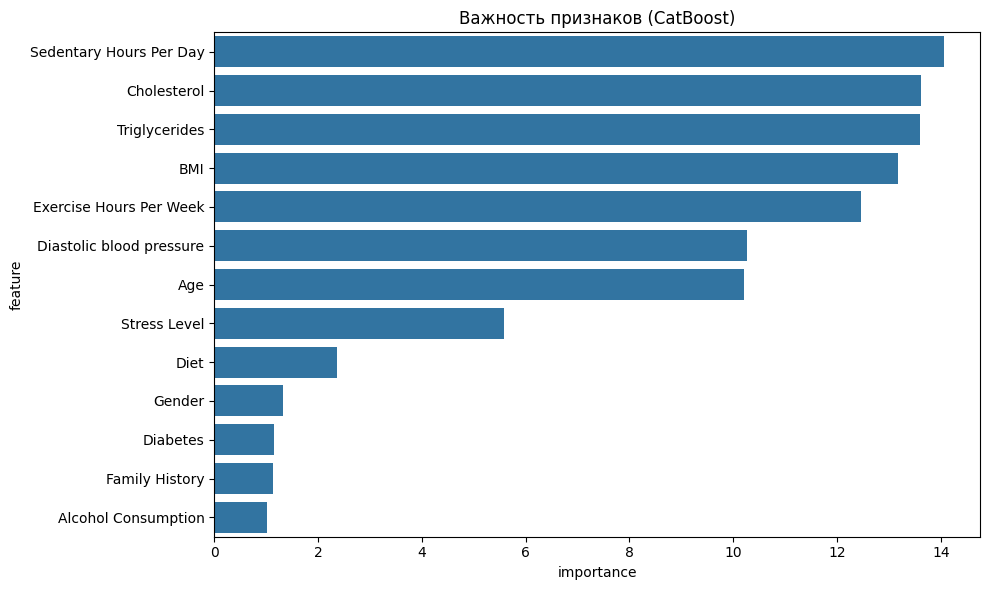

In [82]:
# 1. Получаем доступ к модели внутри Pipeline
best_catboost_model = best_model.named_steps['models']

# 2. Получаем важность признаков
importances = best_catboost_model.get_feature_importance()

# 3. Получаем имена признаков, в том порядке, в котором модель их ожидает
features = best_catboost_model.feature_names_

# 4. Создаем DataFrame
feature_importance_df = pd.DataFrame({
    'feature': features,
    'importance': importances
}).sort_values(by='importance', ascending=False)

# 5. Визуализация
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance_df)
plt.title('Важность признаков (CatBoost)')
plt.tight_layout()
plt.show()

В топ-5 факторов, влияющих на риск поражения сердца входят: `Sedentary Hours Per Day`, `Cholesterol`, `Triglycerides`, `BMI`, `Exercise Hours Per Week`. Всех менее важные признаки: `Alcohol Consumption`, `Family History`, `Diabetes`, `Gender`.

In [83]:
# Смотрим порядок классов
print("Порядок классов в модели:", best_catboost_model.classes_)

Порядок классов в модели: [0 1]


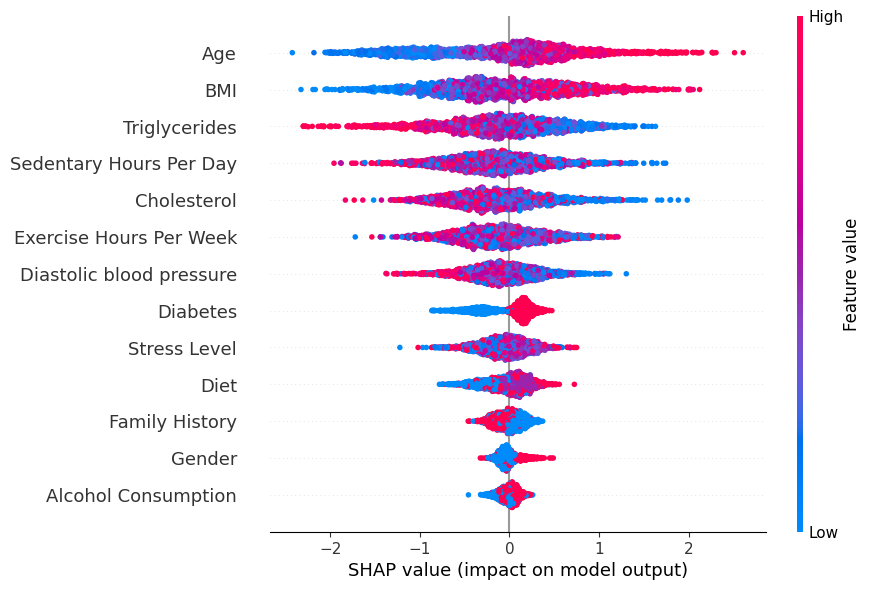

CPU times: total: 2min 56s
Wall time: 18.9 s


In [84]:
%%time
# 1. Извлечение препроцессора из модели
data_preprocessor = best_model.named_steps['preprocessor']

# 2. Обработка валиадционных данных
X_valid_processed = data_preprocessor.transform(X_valid)

# 3. Получение индексов категориальных признаков
cat_feature_indices = best_catboost_model.get_cat_feature_indices()

# 4. Создание Pool
pool = Pool(data=X_valid_processed, cat_features=cat_feature_indices)

# 5. Вычисление SHAP-значений
explainer = shap.TreeExplainer(best_catboost_model)
shap_values = explainer.shap_values(pool)

# 6. Обёртка в объект Explanation (важно для beeswarm)
shap_values_obj = shap.Explanation(
    values=shap_values,
    base_values=explainer.expected_value * np.ones(len(shap_values)),  # Ожидаемое значение для всех
    data=X_valid_processed.values,  # Данные в виде numpy
    feature_names=X_valid_processed.columns.tolist()  # Имена признаков
)

# 7. Визуализация beeswarm
shap.plots.beeswarm(shap_values_obj, max_display=18)

Логике поддаются SHAP-значения следующих признаков: `Age`, `BMI`, `Diabetes`, `Alcohol Consumption`. Увеличение значений первых двух признаков, а также наличие `1` у двух других увеличивает вероятность иметь повышенный риск поражения сердца. Влияние на предсказание остальных признаков либо имеют смешанный характер, либо противоречит логике. К последним относятся: `Triglycerides`, `Sedentary Hours Per Day`, `Cholesterol`, `Diastolic blood pressure`, `Diet`, `Family History`. Однако стоит не забывать слабые корреляции входных признаков с целевым и возможные комплексные взаимодействия признаков. Все вместе могло дать ту диаграмму, которую мы видим.

### Анализ confusion matrix

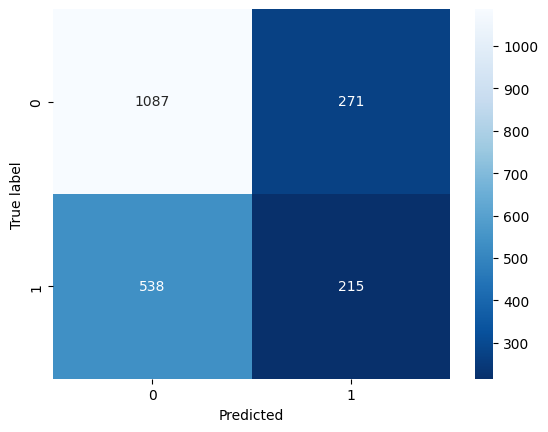

In [85]:
# Матрица ошибок
cm = confusion_matrix(y_valid, grid_search_cb.predict(X_valid))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('Predicted');

In [86]:
# Расчет метрик на валиадционной выборке
accuracy = accuracy_score(y_valid, grid_search_cb.predict(X_valid))
recall = recall_score(y_valid, grid_search_cb.predict(X_valid))
specificity = specificity_score(y_valid, grid_search_cb.predict(X_valid))
precision = precision_score(y_valid, grid_search_cb.predict(X_valid))
f1 = f1_score(y_valid, grid_search_cb.predict(X_valid))
roc_auc = roc_auc_score(y_valid, y_valid_pred)

# Вывод метрик на валиадционной выборке
print(f'Accuracy: {accuracy:.4f}')
print(f'Specificity: {specificity:.4f}')
print(f'Recall: {recall:.4f}')
print(f'Precision: {precision:.4f}')
print(f'F1-score: {f1:.4f}')
print(f'ROC-AUC: {roc_auc:.4f}')

Accuracy: 0.6168
Specificity: 0.8004
Recall: 0.2855
Precision: 0.4424
F1-score: 0.3471
ROC-AUC: 0.6004


Изначально мы видим хорошую специфичность — 0.80 при удовлетворительном ROC-AUC — 0.60 и не сильно низкой чувствительности — 0.29. Тем не менее, предлагается поднять специфичность до 0.85.

In [87]:
# Настраиваем порог для специфичности
y_scores = grid_search_cb.predict_proba(X_valid)[:, 1]
fpr, tpr, thresholds = roc_curve(y_valid, y_scores)

# Нахождение порога, соответствующего выбранной специфичности
target_specificity = 0.85
tnr = 1 - fpr
best_idx = np.argmin(np.abs(tnr - target_specificity))
best_threshold = thresholds[best_idx]

# Применим порог
y_pred = (y_scores >= best_threshold).astype(int)

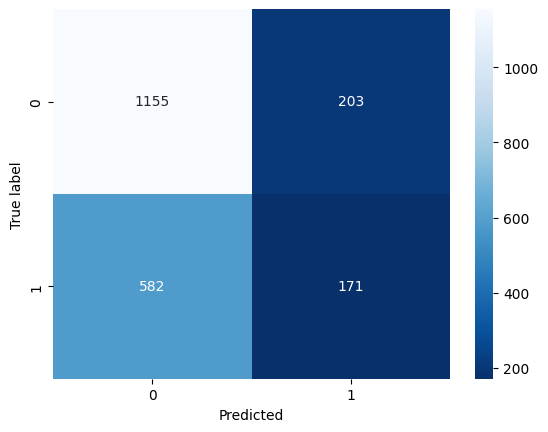

In [88]:
# Матрица ошибок
cm = confusion_matrix(y_valid, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('Predicted');

In [89]:
# Расчет метрик на валиадционной выборке
accuracy = accuracy_score(y_valid, y_pred)
recall = recall_score(y_valid, y_pred)
specificity = specificity_score(y_valid, y_pred)
precision = precision_score(y_valid, y_pred)
f1 = f1_score(y_valid, y_pred)
roc_auc = roc_auc_score(y_valid, y_scores)

# Вывод метрик на валиадционной выборке
print(f'Accuracy: {accuracy:.4f}')
print(f'Specificity: {specificity:.4f}')
print(f'Recall: {recall:.4f}')
print(f'Precision: {precision:.4f}')
print(f'F1-score: {f1:.4f}')
print(f'ROC-AUC: {roc_auc:.4f}')

Accuracy: 0.6281
Specificity: 0.8505
Recall: 0.2271
Precision: 0.4572
F1-score: 0.3035
ROC-AUC: 0.6004


Увеличив специфичность с 0.80 до 0.85 за счет изменения порога классификации при удовлетворительном ROC-AUC — 0.60 чувствительность уменьшается с 0.29 до 0.23. Поскольку в условиях нет каких-либо ограничений на чувстительность, то будем считать соответствующий порог классификации удовлетворительным.

## Feature Engineering

## Итоговые выводы

1. Во время предобработки пропуски, доля которых <5% — удалены, категориальные признаки преобразованы в `object`, дубликаты не обнаружены. Установлено, что числовые признаки изначально масштабированы.
2. С помощью обзора литературы выделены релевантные признаки, исследование данных в которых позволило сформировать окончательный набор признаков для моделирования. Обнаружены особенности некоторых признаков: 0.78 людей в выборках имеют одинаковое значение непрерывного признака `Blood sugar` и отсутствие некурящих мужчин, что указывает на не объективный сбор данных касательно признаков `Blood sugar` и `Smoking`.
3. В ходе исследования данных обнаружен дисбаланс классов целевого признака, что при моделировании решалось с помощью техники балансировки классов (например — `class_weight='balanced'` или `scale_pos_weight` для `CatBoostClassifier`).
4. Для выбора лучшей модели принято решение использовать стратифицированную кросс-валидацию и метрику AUC-ROC, так как стратифицированная кросс-валидация гарантирует, что пропорции классов целевого признака в каждом фолде будут такими же, как и в исходных данных, а метрика `ROC-AUC` менее чувствительна к дисбалансу классов и при этом объективно сравнивает разные модели, так как она измеряет общую способность модели ранжировать примеры, а также имеет независимость от порога классификации.
5. Исследовательский и корреляционный анализы указывают на слабые парные корреляции признаков и отсутствие мультиколлинеарности.
6. Лучшую предсказательную способность среди `DecisionTreeClassifier`, `LogisticRegression`, `SVC`, `CatBoostClassifier` продемонстрировала модель `CatBoostClassifier`, которая показывает метрику ROC-AUC на валиадционной выборке: 0.600.
7. Согласно модели `CatBoostClassifier` в топ-5 факторов, влияющих на риск поражения сердца входят: `Sedentary Hours Per Day`, `Cholesterol`, `Triglycerides`, `BMI`, `Exercise Hours Per Week`. Всех менее важные признаки среди используемых: `Alcohol Consumption`, `Family History`, `Diabetes`, `Gender`.
8. Feature Engineering в том объеме, который применялся в данном проекте, не принес улучшения метрик. Рекомендуется более детальная работа с новыми признаками на основе их исследовательского анализа, а также вариация комбинаций признаков. Отметим одну из сложностей для Feature Engineering — изначально масштабированные числовые признаки — что добавляет ограничения на создание новых признаков исходя из логики и научных фактов.
9. Что касается целевой метрики `Специфичность`, то на валиадционной выборке мы видим уверенное значение — 0.80 при удовлетворительном ROC-AUC — 0.60 и не сильно низкой чувствительности — 0.29. Для увеличения специфичности до 0.85 с помощью изменения порога классификации приходится пожертвовать чувствительностью, которая опускается до 0.23.

Отметим важность выбора порога классификации, так как увеличивая специфичность, чувствительность уменьшается и наоборот. Поэтому значение порога классификации нужно подбирать в зависимости от цели: в экстренной диагностике инфаркта чувствительность будет приоритетной, а в плановых обследованиях — специфичность.

## Сохранение предсказаний на тестовой выборке и артефактов